In [1]:
import numpy as np 
import pathlib 
import h5py
import os
import datetime 
import pandas as pd
import warnings
import scipy
import pathlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
# import seaborn_image as isns
sns.set_theme()
import os 
import napari
import skimage.measure
import copy
import math
import natsort

import space
import plotting
import temporal
import utilities
import filehandling
import utilities
import unit_conversion
import signal_analysis
import contouring
from utilities import multicolour_reshape as reshape
# qgrid.enable() 
# import pandasgui
# import tabloo}

# %matplotlib widget
# plt.ioff()
test_path =r"D:\Igor analyses\230613\0_1_ColorSWN_200_0\2023-6-13_0_1_ColourSWN_200_0.h5"
#test_path =r"C:\Users\Simen\Downloads\2023-6-13_'0_1_ColorSWN_200_0'.h5"

# test_path = r"C:\Users\Simen\Downloads\2023-6-13_Testimport.h5"
# test2 = r"C:\Users\Simen\Downloads\2023-5-2_SMP_0_0_SWN_UV_100_0.h5"
import tifffile
import PIL

In [146]:
roi_df = pd.read_pickle(r"D:\DataFrames\roi_df.pkl")
rec_df = pd.read_pickle(r"D:\DataFrames\rec_df.pkl")
chroma_df = pd.read_pickle(r"D:\DataFrames\chroma_df.pkl")

,ipl_depths,pols_corr
0,74.0,NaN
1,74.0,NaN
2,74.0,NaN
3,74.0,NaN
4,10.0,NaN
...,...,...
1919,94.0,NaN
1920,96.0,NaN
1921,96.0,-0.300752
1922,96.0,-0.899248


In [155]:
roi_df.columns

Index(['ipl_depths', 'strf_keys', 'multicolour', 'roi', 'date', 'path',
       'filename', 'colour', 'simultaneous', 'combo', 'size', 'shapeZ',
       'shapeY', 'shapeX', 'XYratio', 'visang_size', 'frequency', 'noise',
       'time_pval', 'space_pval', 'neg_contour_count', 'pos_contour_count',
       'total_contour_count', 'neg_contour_areas', 'pos_contour_areas',
       'neg_contour_area_total', 'pos_contour_area_total',
       'contour_area_total', 'contour_complexity', 'neg_extrema',
       'pos_extrema', 'polarities', 'neg_biphasic_index', 'pos_biphasic_index',
       'dom_biphasic_index', 'pols_corr', 'neg_auc', 'pos_auc', 'neg_peaktime',
       'pos_peaktime', 'dom_peaktime', 'neg_centroids', 'pos_centroids',
       'dom_centroids', 'cell_id'],
      dtype='object')

In [161]:
from sklearn.cluster import AgglomerativeClustering
clustering = AgglomerativeClustering().fit(roi_df[["ipl_depths", "size"]].values)
#https://stackoverflow.com/questions/67366872/converting-string-values-of-a-column-in-a-csv-file-to-int-or-float-values-to-cre

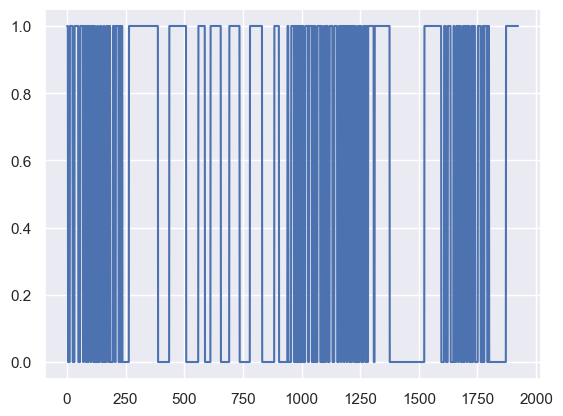

In [164]:
plt.plot(clustering.labels_)

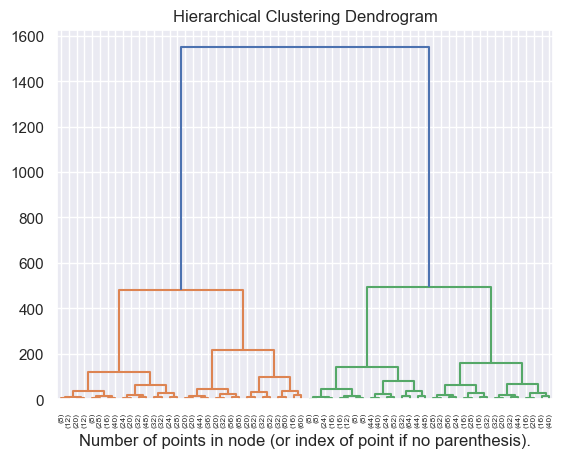

In [184]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram

from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import load_iris


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


iris = load_iris()
X = roi_df[["ipl_depths", "size"]].values

# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(X)
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=5)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [2]:
%reload_ext autoreload
%autoreload 2

In [5]:
loadfile = filehandling.load_from_hdf5(test_path)
print(dir(loadfile))

['IslandAmpls', 'IslandTimeKernels', 'IslandTimeKernels_Pol_rel', 'IslandTimeKernels_Polarities', 'Island_Sum', 'IslandsX', 'IslandsY', 'OS_Parameters', 'Positions', 'ROIs', 'STRF0_0_0', 'STRF0_0_1', 'STRF0_0_2', 'STRF0_0_3', 'STRF0_10_0', 'STRF0_10_1', 'STRF0_10_2', 'STRF0_10_3', 'STRF0_11_0', 'STRF0_11_1', 'STRF0_11_2', 'STRF0_11_3', 'STRF0_12_0', 'STRF0_12_1', 'STRF0_12_2', 'STRF0_12_3', 'STRF0_13_0', 'STRF0_13_1', 'STRF0_13_2', 'STRF0_13_3', 'STRF0_14_0', 'STRF0_14_1', 'STRF0_14_2', 'STRF0_14_3', 'STRF0_15_0', 'STRF0_15_1', 'STRF0_15_2', 'STRF0_15_3', 'STRF0_16_0', 'STRF0_16_1', 'STRF0_16_2', 'STRF0_16_3', 'STRF0_17_0', 'STRF0_17_1', 'STRF0_17_2', 'STRF0_17_3', 'STRF0_18_0', 'STRF0_18_1', 'STRF0_18_2', 'STRF0_18_3', 'STRF0_1_0', 'STRF0_1_1', 'STRF0_1_2', 'STRF0_1_3', 'STRF0_2_0', 'STRF0_2_1', 'STRF0_2_2', 'STRF0_2_3', 'STRF0_3_0', 'STRF0_3_1', 'STRF0_3_2', 'STRF0_3_3', 'STRF0_4_0', 'STRF0_4_1', 'STRF0_4_2', 'STRF0_4_3', 'STRF0_5_0', 'STRF0_5_1', 'STRF0_5_2', 'STRF0_5_3', 'STRF0_6_0

In [8]:
fff_files = filehandling.find_files_in(".h5", r"D:\Igor analyses", search_terms = ["FFF"], recursive=True)
fff_files

[WindowsPath('D:/Igor analyses/231116/2023-11-16_MP_0_1_FFF_RGBU.h5'),
 WindowsPath('D:/Igor analyses/231116/2023-11-16_MP_0_2_FFF_RGBU.h5')]

In [13]:
tiff_path = r"C:\Users\SimenLab\OneDrive - University of Sussex\Desktop\AverageStack0_Chopped.tif"

(32, 64, 500, 3)


(32, 64, 500)

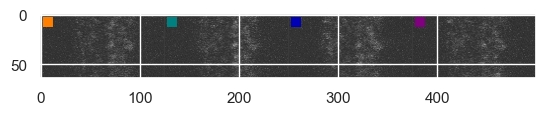

In [73]:
def stack_to_rgb(stack, eight_bit = True):
    stack = np.repeat(np.expand_dims(stack, -1), 3, -1)
    if eight_bit == True:
        stack = utilities.min_max_norm(stack, 0, 255).astype('int')
    else:
        stack = utilities.min_max_norm(stack, 0, 1).astype('float')
    return stack
rgb_image = stack_to_rgb(load_image)

def basic_stim_overlay(rgb_array, frame_width = 125, xy_loc = (3, 3), frame_duration = 32, size = 10, repeat_interval = 4, colour_list = [(255, 128, 0), (0, 128, 128), (0, 0, 180), (128, 0, 128)]):
    # Prep colour list 
    if len(colour_list) == 1:
        np.tile(colour_list, (repeat_interval, 1))
    for i in range(repeat_interval):
        # Frame, y, x
        rgb_array[0:frame_duration, xy_loc[1]:xy_loc[1]+size, xy_loc[0] + frame_width*i: xy_loc[0] + size+frame_width*i] = colour_list[i]
    return rgb_array

load_image = tifffile.imread(tiff_path)
rgb_image = stack_to_rgb(load_image)
rgb_image = basic_stim_overlay(rgb_image)
print(rgb_image.shape)
plt.imshow(rgb_image[2])
load_image.shape

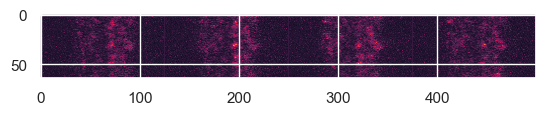

In [110]:
plt.imshow(example_data.AverageStack0_Chopped[:, :, 2].T)

In [127]:
example_data.AverageStack0_Chopped.T.shape

(32, 64, 500)

In [126]:
np.moveaxis(example_data.AverageStack0_Chopped.T, -1, 0).shape

(500, 32, 64)

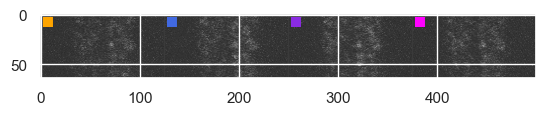

In [145]:
path = r"D:\Igor analyses\231005\2023-10-5_MP_1_1_FFF_RGBUV.h5"
example_data = filehandling.load_from_hdf5(path)
example_data_temp = filehandling.load_data(path)
pop_array = np.array(example_data.Averages0)
plotting.stack_to_rgb(example_data.AverageStack0_Chopped.T).shape
plt.imshow(plotting.basic_stim_overlay(example_data.AverageStack0_Chopped.T)[0])

In [65]:
example_data.AverageStack0_Chopped.shape

(500, 64, 32)

In [60]:
np.rollaxis(example_data.AverageStack0_Chopped, 0, 3).shape

(64, 32, 500)

In [8]:
loadfile.check_ipl_orientation()

(8.703651757862453, -14.342242489537899)

In [9]:
loadfile.ipl_depths

array([14., 17., 18., 18., 32., 35., 37., 55., 61., 64., 65., 69., 75.,
       81., 80., 79., 94., 95., 96.], dtype=float32)

In [63]:
def check_ipl_orientation():    
    maxes = np.max(loadfile.dominant_timecourses(), axis = 1)
    mins = np.min(loadfile.dominant_timecourses(), axis = 1)
    # Combine the arrays into a 2D array
    combined_array = np.vstack((mins, maxes))
    # Find the index of the maximum absolute value along axis 0
    max_abs_index = np.argmax(np.abs(combined_array), axis=0)
    # Use the index to get the values with their signs intact
    result_values = combined_array[max_abs_index, range(combined_array.shape[1])]
    # Average every 4th value to get a weighted polarity for each ROI
    mean_pols_by_roi = np.nanmean(result_values.reshape(4, -1), axis=0)
    return (np.sum(mean_pols_by_roi[:int(len(mean_pols_by_roi)/2)]), np.sum(mean_pols_by_roi[int(len(mean_pols_by_roi)/2):]))

check_ipl_orientation()

(8.703651757862453, -14.342242489537899)

In [45]:
print(mean_pols_by_roi)
print(loadfile.ipl_depths)

[-0.33178815  3.32183968  2.09905954 -1.52896633 -2.36552778  2.51114637
  4.63512932  1.50506913 -1.14231002 -3.17115612 -1.41119923 -1.74535536
  0.0359463  -3.42830472 -3.99730098 -1.61949548  4.07575966 -1.58914939
 -1.49198718]
[14. 17. 18. 18. 32. 35. 37. 55. 61. 64. 65. 69. 75. 81. 80. 79. 94. 95.
 96.]


In [41]:
napari.view_image(load_image)

Viewer(axes=Axes(visible=False, labels=True, colored=True, dashed=False, arrows=True), camera=Camera(center=(0.0, 31.5, 249.5), zoom=3.7354, angles=(0.0, 0.0, 90.0), perspective=0.0, interactive=True), cursor=Cursor(position=(32.0, 1.0, 0.0), scaled=True, size=1, style=<CursorStyle.STANDARD: 'standard'>), dims=Dims(ndim=3, ndisplay=2, last_used=0, range=((0.0, 64.0, 1.0), (0.0, 64.0, 1.0), (0.0, 500.0, 1.0)), current_step=(32, 32, 250), order=(0, 1, 2), axis_labels=('0', '1', '2')), grid=GridCanvas(stride=1, shape=(-1, -1), enabled=False), layers=[<Image layer 'load_image' at 0x1bf8a0b8af0>], scale_bar=ScaleBar(visible=False, colored=False, color=array([1., 0., 1., 1.], dtype=float32), ticks=True, position=<Position.BOTTOM_RIGHT: 'bottom_right'>, font_size=10.0, box=False, box_color=array([0. , 0. , 0. , 0.6], dtype=float32), unit=None), text_overlay=TextOverlay(visible=False, color=array([0.5, 0.5, 0.5, 1. ], dtype=float32), font_size=10.0, position=<TextOverlayPosition.TOP_LEFT: 'top

In [168]:
test_list = [(1,2,3), (3, 2, 1)]
len(test_list)

2

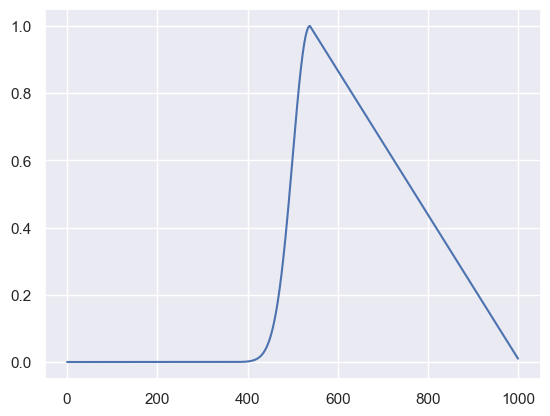

In [3]:
import numpy as np
import sympy as sp

x = sp.symbols('x')

m = -.5
b = 1.33
x_step = m+2
A = 1
μ = 2
σ = .5
k = 2
x0 = -3


linear_component = m * x*.33 + b
gaussian_component = A * sp.exp(-((x - μ)**2) / (2 * σ**2))
sigmoid_component = 1 / (1 + sp.exp(-k * (x - x0)))
step_function = sp.Piecewise((1, x < x_step), (.5, x >= x_step))
step_linear = sp.Piecewise((1, x < x_step), (linear_component, x >= x_step))

# template_signal = gaussian_component #* step_function#+ linear_component + gaussian_component + sigmoid_component
# template_signal = gaussian_component * step_linear
template_signal = sp.Piecewise((gaussian_component, x < 2.0), (linear_component, x > 2))

template_signal_func = sp.lambdify(x, template_signal, 'numpy')

n = 1000
x_values = np.linspace(-5, 8, n)
template_signal_values = template_signal_func(x_values)
plt.plot(template_signal_values)

# Template matching attempt

In [2]:
# Make some functions that do maths functions (yay fun)
def linear(m, n):
    return m * +

# Other stuff

In [4]:
data = filehandling.load_from_hdf5(test_path)

(10, 10, 1)


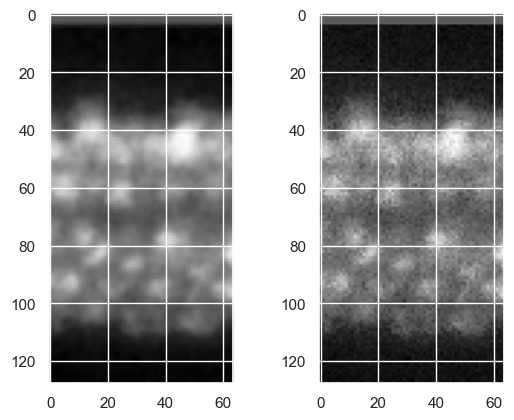

In [61]:
kernel = np.expand_dims(utilities.make2DGaussian(10, 2), 2)
print(kernel.shape)
test = scipy.ndimage.correlate(data.wDataCh0_detrended[:, :, 0:5000], weights=kernel)
average_stack = np.average(test, axis = 2)
average_stack_org = np.average(data.wDataCh0_detrended[:, :, 0:5000], axis = 2)

# plt.imshow()
# plt.imshow(average_stack, cmap = "Greys_r")
fig, ax = plt.subplots(1, 2)
ax[0].imshow(average_stack, cmap = "Greys_r")
ax[1].imshow(average_stack_org, cmap = "Greys_r")

In [71]:
napari.view_image(np.swapaxes(data.wDataCh0_detrended, 0, 2))

Viewer(axes=Axes(visible=False, labels=True, colored=True, dashed=False, arrows=True), camera=Camera(center=(0.0, 31.5, 63.5), zoom=6.026562500000001, angles=(0.0, 0.0, 90.0), perspective=0.0, interactive=True), cursor=Cursor(position=(25000.0, 1.0, 0.0), scaled=True, size=1, style=<CursorStyle.STANDARD: 'standard'>), dims=Dims(ndim=3, ndisplay=2, last_used=0, range=((0.0, 50000.0, 1.0), (0.0, 64.0, 1.0), (0.0, 128.0, 1.0)), current_step=(25000, 32, 64), order=(0, 1, 2), axis_labels=('0', '1', '2')), grid=GridCanvas(stride=1, shape=(-1, -1), enabled=False), layers=[<Image layer 'Image' at 0x1638ad11990>], scale_bar=ScaleBar(visible=False, colored=False, color=array([1., 0., 1., 1.], dtype=float32), ticks=True, position=<Position.BOTTOM_RIGHT: 'bottom_right'>, font_size=10.0, box=False, box_color=array([0. , 0. , 0. , 0.6], dtype=float32), unit=None), text_overlay=TextOverlay(visible=False, color=array([0.5, 0.5, 0.5, 1. ], dtype=float32), font_size=10.0, position=<TextOverlayPosition.T

In [14]:
120/8

15.0

In [2]:
# pooled_functions = np.load(r"C:\Users\Simen\Downloads\pooled_functions_spaceabsmax.npy")
pooled_functions = np.load(r"C:\Users\SimenLab\Downloads\pooled_functions_timeabsmax.npy")

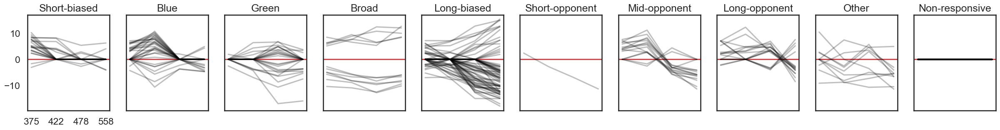

In [3]:
labels_arr = signal_analysis.category_labels(pooled_functions, plot = True)
# file.spectral_tuning_functions().tolist()

In [6]:
fig

NameError: name 'fig' is not defined

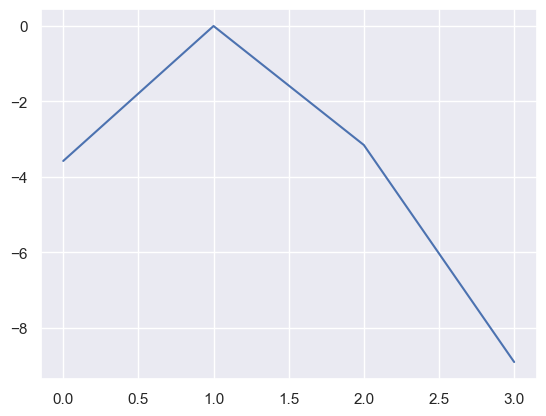

In [9]:
plt.plot(pooled_functions[111])

2. group the non-opp kernels, following the rules:

Non-responsive, -- 0

Long-biased if abs(R+G)>abs(B+U)*2, -- 1

Short-biased if abs(R+G)<abs(B+U), -- 2

Mid-biased if abs(G+B)>abs(R+U)*2, -- 3

V-shaped if abs(R+U)>abs(G+B)*2, -- 4 

else: “Broad”. -- 5

3. group the opp kernels

Short-opponent if (R+G>0 && U<0) || (R+G<0 && U>0), -- 6

Mid-opponent if (R>0 && B<0) || R<0 && B>0), -- 7 

Long-opponent if (R>0 && G<0) || (R<0 && G>0). -- 8

Finally, in rare cases where (R>0 && G<0 && U>0) || (R<0 && G>0 && U<0), BCs were allocated as long-opponent if  abs(R)>abs(U) but as short-opponent if abs(R)<abs(U).

In [8]:
pooled_functions
max_abs_per_row = np.max(np.abs(pooled_functions), axis=1, keepdims=True)
pooled_functions_scaled = pooled_functions / max_abs_per_row
pooled_functions_scaled

C:\Users\SimenLab\AppData\Local\Temp\ipykernel_22488\3398474831.py:3: RuntimeWarning: invalid value encountered in divide
  pooled_functions_scaled = pooled_functions / max_abs_per_row


array([[ 0.        ,  0.        , -0.64575904, -1.        ],
       [ 0.        ,  1.        ,  0.        ,  0.        ],
       [ 1.        ,  0.75708986,  0.        ,  0.        ],
       ...,
       [        nan,         nan,         nan,         nan],
       [ 0.        ,  0.        ,  1.        ,  0.        ],
       [ 0.        ,  0.        , -1.        ,  0.        ]])

In [ ]:

        scaled = pooled_functions[roi] / np.max(np.abs(pooled_functions[roi]))
        scaled_thresh = np.where(np.abs(scaled.T) > thresh, scaled.T, 0)
        print(scaled_thresh) 
        print(spectral_tuning_functions_scaled_thresh.T[roi])
        print(all_u[roi], all_b[roi], all_g[roi], all_r[roi])

In [61]:
sns.set_context("talk")

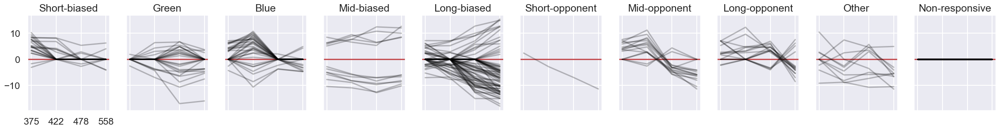

In [119]:
def category_labels(spectral_tuning_functions, thresh = 0, return_arrs = False, minmax_scale = False, plot = True, **kwargs):
    # Threshold and get all R, G, B, and UV values from the tuning functions 
    if minmax_scale == True:
        ax_abs_per_row = np.max(np.abs(spectral_tuning_functions), axis=1, keepdims=True)
        spectral_tuning_functions_scaled = spectral_tuning_functions / ax_abs_per_row
        spectral_tuning_functions_scaled_thresh = np.where(np.abs(spectral_tuning_functions_scaled) > thresh, spectral_tuning_functions_scaled, 0)
        all_u, all_b, all_g, all_r = spectral_tuning_functions_scaled_thresh.T
        spectral_tuning_functions = spectral_tuning_functions_scaled_thresh
        # spectral_tuning_functions = np.apply_along_axis(utilities.min_max_norm, 1, spectral_tuning_functions, -1, 1)
        # all_u, all_b, all_g, all_r = [i for i in np.where(np.abs(spectral_tuning_functions.T) > thresh, spectral_tuning_functions.T, 0)]
    else:
        all_u, all_b, all_g, all_r = [i for i in np.where(np.abs(spectral_tuning_functions.T) > thresh, spectral_tuning_functions.T, 0)]
    # Generate label bool arrays 
    _short_bias = (np.abs(all_u) > np.abs(all_b)) & (np.abs(all_r) < np.abs(all_u)) & ((np.abs(all_b) > np.abs(all_g)) | (np.abs(all_u) > np.abs(all_b) + np.abs(all_g) + np.abs(all_r)))
    # _long_bias = (np.abs(all_u) < np.abs(all_b)) & (np.abs(all_b) < np.abs(all_g)) & (np.abs(all_g) < np.abs(all_r))
    _long_bias = ((np.abs(all_b) < np.abs(all_g)) & (np.abs(all_g) < np.abs(all_r)) & (np.abs(all_u) < np.abs(all_r)) & (np.abs(all_u) < np.abs(all_g))) | (np.abs(all_r) > (np.abs(all_g)+np.abs(all_b)+np.abs(all_u)))
    _mid_bias = (np.abs(all_b) + np.abs(all_g) > (np.abs(all_u) + np.abs(all_r))) & ((np.abs(all_r) < np.abs(all_g)) & (np.abs(all_b) > np.abs(all_u))) & ((np.sign(all_b) == np.sign(all_g)) & (np.sign(all_u) == np.sign(all_r)))
    _b_bias = ((np.abs(all_b) > np.abs(all_u)) & (np.abs(all_b) > np.abs(all_g)) & (np.abs(all_g) + np.abs(all_r) < np.abs(all_b)))
    # print(_b_bias)
    _g_bias = ((np.abs(all_g) > np.abs(all_b)) & (np.abs(all_g) > np.abs(all_r)) & (np.abs(all_u) + np.abs(all_b) < np.abs(all_g))) 
    # Broad: apply if all polarities are the same and nothing else applies 
    _broad = np.abs(all_r > 0) & np.abs(all_g > 0) & np.abs(all_b > 0) & np.abs(all_u > 0)
    # For now, put broad togetehr with mid-biased
    _mid_bias = _broad | _mid_bias
    # Tidy up broad (will probably just be empty)
    _broad = _broad * ((_broad != _short_bias) & (_broad != _mid_bias) & (_broad != _long_bias)  & (_broad != _g_bias)  & (_broad != _b_bias))

    _non_response = np.abs(all_r == 0) & np.abs(all_g == 0) & np.abs(all_b == 0) & np.abs(all_u == 0)
    # Generate label bool arrays for opponencies     
    _short_opp = (((((all_r + all_g > 0) & (all_u  < 0)) & (all_b > 0)) | (((all_r + all_g < 0) & (all_u > 0)) & (all_b < 0))))
    _long_opp = (((all_r > 0) & (all_g < 0)) | ((all_r < 0) & (all_g > 0)))# (R>0 && G<0) || (R<0 && G>0)
    _mid_opp = (((all_g > 0) & (all_b < 0)) | ((all_g < 0) & (all_b > 0))) # (R>0 && B<0) || R<0 && B>0)
    
    # Give priority to opponency versus the other catagories 
    _short_bias = _short_bias * (_short_bias * (_short_bias != _short_opp)) & (_short_bias * (_short_bias != _mid_opp)) & (_short_bias * (_short_bias != _long_opp))
    _mid_bias = _mid_bias * (_mid_bias * (_mid_bias != _short_opp)) & (_mid_bias * (_mid_bias != _mid_opp)) & (_mid_bias * (_mid_bias != _long_opp))
    _long_bias = _long_bias * (_long_bias * (_long_bias != _short_opp)) & (_long_bias * (_long_bias != _mid_opp)) & (_long_bias * (_long_bias != _long_opp))
    _g_bias = _g_bias * (_g_bias * (_g_bias != _short_opp)) & (_g_bias * (_g_bias != _mid_opp)) & (_g_bias * (_g_bias != _long_opp))
    _b_bias = _b_bias * (_b_bias * (_b_bias != _short_opp)) & (_b_bias * (_b_bias != _mid_opp)) & (_b_bias * (_b_bias != _long_opp))
    _broad = _broad *  (_broad * (_broad != _short_opp)) & (_broad * (_broad != _mid_opp)) & (_broad * (_broad != _long_opp))
    # # Mid also yields versus the other groups
    _mid_bias = _mid_bias * ((_mid_bias != _b_bias) & (_mid_bias != _g_bias) & (_mid_bias != _long_bias) & (_mid_bias != _short_bias))
    # _long_bias = (_long_bias * (_long_bias != _mid_bias))
    # _short_bias = (_short_bias * (_short_bias != _mid_bias))
    # _mid_bias = _mid_bias * ((_mid_bias * (_mid_bias != short_opp)) & (_mid_bias * (_mid_bias != mid_opp)) & (_mid_bias * (_mid_bias != long_opp))
    # & (_mid_bias * (_mid_bias != short_bias)) & (_mid_bias * (_mid_bias != long_bias)))

    # Generate labels 
    ## Array creation
    _labels_arr = np.empty(len(spectral_tuning_functions), dtype = "U10")
    # _bool_arr = np.array([_short_bias, _g_bias, _b_bias, _mid_bias, _long_bias, _broad, _short_opp, _mid_opp, _long_opp]).T
    _bool_arr = np.array([_short_bias, _g_bias, _b_bias, _mid_bias, _long_bias, _short_opp, _mid_opp, _long_opp, _non_response]).T

    ## Templates 
    short_template =   [True, False, False, False, False, False, False, False, False]
    g_template =       [False, True, False, False, False, False, False, False, False]
    b_template =       [False, False, True, False, False, False, False, False, False]    
    mid_template =     [False, False, False, True, False, False, False, False, False]
    long_template =    [False, False, False, False, True, False, False, False, False] 	#False	False	False	False	True	False	False	False	False
    #broad_template =   [False, False, False, False, False, True, False, False, False]
    short_opp_template=[False, False, False, False, False, True, False, False, False]
    mid_opp_template = [False, False, False, False, False, False, True, False, False]
    long_opp_template =[False, False, False, False, False, False, False, True, False]
    non_resp_template =[False, False, False, False, False, False, False, False, True]
    # non_responsive = []
    ## Template matching and label assigning 
    _labels_arr[np.where(np.all(_bool_arr == short_template, axis = 1))] = "short"
    _labels_arr[np.where(np.all(_bool_arr == g_template, axis = 1))] = "g"
    _labels_arr[np.where(np.all(_bool_arr == b_template, axis = 1))] = "b"
    _labels_arr[np.where(np.all(_bool_arr == mid_template, axis = 1))] = "mid"
    _labels_arr[np.where(np.all(_bool_arr == long_template, axis = 1))] = "long"
    # _labels_arr[np.where(np.all(_bool_arr == broad_template, axis = 1))] = "broad"
    _labels_arr[np.where(np.all(_bool_arr == short_opp_template, axis = 1))] = "short_opp"
    _labels_arr[np.where(np.all(_bool_arr == mid_opp_template, axis = 1))] = "mid_opp"
    _labels_arr[np.where(np.all(_bool_arr == long_opp_template, axis = 1))] = "long_opp"
    _labels_arr[np.where(np.all(_bool_arr == non_resp_template, axis = 1))] = "non_resp"
    _labels_arr[np.where(_labels_arr == "")] = "other"

    if "print_reminder" in kwargs and kwargs["print_reminder"] == True:
        print("Label arrays in order: Long-biased, short-biased, mid-biased, v-biased, broad/achromatic, short-opponent, mid-opponent, long-opponent")
    if "print_var_names" in kwargs and kwargs["print_var_names"] == True:
        print("Vars: long_bias, short_bias, mid_bias, v_bias, broad, short_opp, mid_opp, long_opp")
    
    if plot == True:
        fig, axs = plt.subplots(1, 10, figsize = (10*3, 1*3), sharex=False, sharey=True)
        for n, ax in enumerate(axs):
            ax.set_xticks([0, 1, 2, 3], ["375", "422","478","558"]);
            if n != 0:
                ax.set_xticks([0, 1, 2, 3], ["", "", "", ""])
            ax.axhline(0, c = "r")
            ax.grid(True)
        for n, i in enumerate(spectral_tuning_functions):
            if _labels_arr[n] == "short":
                axs[0].plot(i.T, c = "black", alpha = 0.25)
            if _labels_arr[n] == "g":
                axs[1].plot(i.T, c = "black", alpha = 0.25)
            if _labels_arr[n] == "b":
                axs[2].plot(i.T, c = "black", alpha = 0.25)
            if _labels_arr[n] == "mid":
                axs[3].plot(i.T, c = "black", alpha = 0.25)
            if _labels_arr[n] == "long":
                axs[4].plot(i.T, c = "black", alpha = 0.25)
            if _labels_arr[n] == "short_opp":
                axs[5].plot(i.T, c = "black", alpha = 0.25)
            if _labels_arr[n] == "mid_opp":
                axs[6].plot(i.T, c = "black", alpha = 0.25)
            if _labels_arr[n] == "long_opp":
                axs[7].plot(i.T, c = "black", alpha = 0.25)
            if _labels_arr[n] == "other":
                axs[8].plot(i.T, c = "black", alpha = 0.25)
            if _labels_arr[n] == "non_resp":
                axs[9].plot(i.T, c = "black", alpha = 0.25)

        titles = ["Short-biased", "Green", "Blue", "Mid-biased", "Long-biased", "Short-opponent", "Mid-opponent", "Long-opponent", "Other", "Non-responsive"]
        for n, i in enumerate(titles):
            axs[n].set_title(i)    
    
    
    if return_arrs == True:
        return _labels_arr, _long_bias, _short_bias, _g_bias, _b_bias, _mid_bias, _broad, _short_opp, _mid_opp, _long_opp #v_bias
    else:
        return _labels_arr

labels_arr, long_bias, short_bias, g_bias, b_bias, mid_bias, broad, short_opp, mid_opp, long_opp = category_labels(pooled_functions, return_arrs=True)

In [122]:
dict = {
    "label"   : labels_arr,
    "short": short_bias,
    "g"    : g_bias,
    "b"    : b_bias,
    "mid"  : mid_bias,
    "long" : long_bias, 
    "broad": broad,
    "short_opp":short_opp,
    "mid_opp":mid_opp,
    "long_opp":long_opp,}
# pd.DataFrame(dict).query("mid_opp == False & long_opp == False & short_opp == False")
df = pd.DataFrame(dict)
df.query("label == 'other'")
# df

,label,short,g,b,mid,long,broad,short_opp,mid_opp,long_opp
33,other,False,False,False,False,False,False,False,False,False
54,other,False,False,False,False,False,False,False,True,True
70,other,False,False,False,False,False,False,False,False,False
110,other,False,False,False,False,False,False,False,False,False
122,other,False,False,False,False,False,False,False,False,False
160,other,False,False,False,False,False,False,False,False,False
167,other,False,False,False,False,False,False,True,True,True
168,other,False,False,False,False,False,False,False,True,True
236,other,False,False,False,False,False,False,True,False,True
251,other,False,False,False,False,False,False,False,False,False


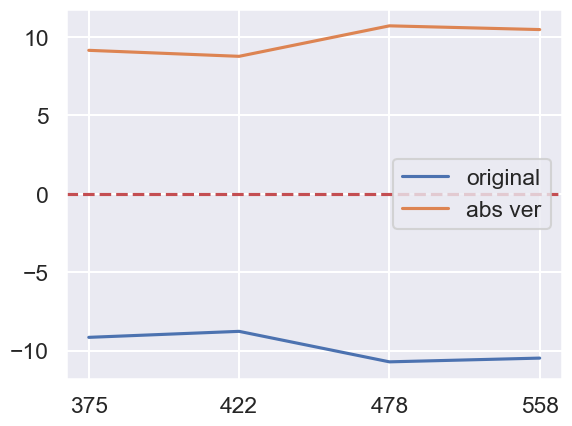

In [132]:
plt.axhline(0, c = 'r', ls = "--")
roi = 160 # 122
thresh = 0
u, b, g, r = np.abs(scaled_thresh)
plt.plot(pooled_functions[roi], label = "original")
plt.plot(np.abs(pooled_functions[roi]), label = "abs ver")
plt.legend()
plt.xticks([0, 1, 2, 3], ["375", "422","478","558"]);

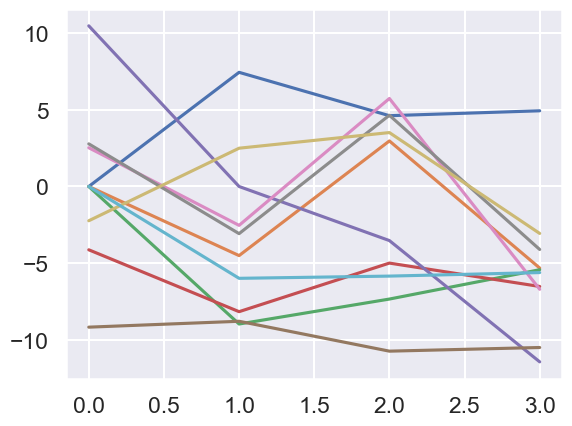

In [124]:
for i in df.query("label == 'other'").index:
    plt.plot(pooled_functions[i])

In [527]:
#blue
((np.abs(b) > np.abs(u)) & (np.abs(b) > np.abs(g)))

True

In [487]:
 #mid
 ((np.abs(b) + np.abs(g) > (np.abs(u) + np.abs(r))) & ((np.sign(b) == np.sign(g)) & (np.sign(u) == np.sign(r))))

False

[-1. -1. -1. -1.]
[ -1.08294508 -25.1175124   -5.06896077  -4.93300816]


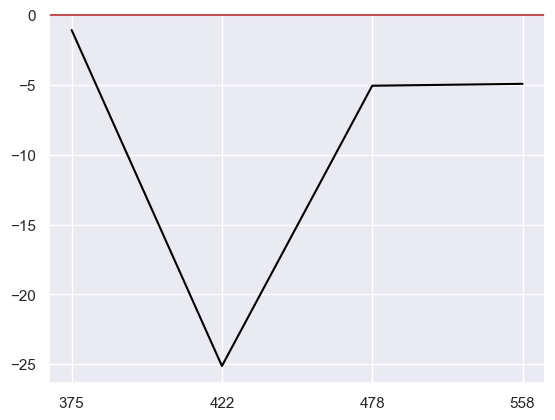

In [1086]:
roi = 18
print(np.sign(file.spectral_tuning_functions()[roi]))
uv, b, g, r = file.spectral_tuning_functions()[roi]
print(np.array([uv, b, g, r]))
# plt.plot(file.spectral_tuning_functions().T, c = "black", alpha = 0.25)
plt.plot(file.spectral_tuning_functions()[roi].T, c = "black")
# plt.plot(np.abs(file.spectral_tuning_functions()[roi].T), c = "yellow")
# plt.plot(file.spectral_tuning_functions()[7].T, c = "blue")
plt.xticks([0, 1, 2, 3], ["375", "422","478","558"]);
plt.axhline(0, c = "r")

In [ ]:
mid_opp 

In [983]:
long_bias_temp = ((np.abs(r) + np.abs(g)) > (np.abs(b) + np.abs(uv))) 
long_bias_temp

True

0 [20.22034735 35.57473355  4.09794286  4.32920742]
1 [12.64238793 27.04129977 -3.35080384 -7.23599484]
2 [13.06046909 26.30280246  2.20844484  3.24036486]
3 [16.20481884 10.84119985  1.9794173  -4.70047327]
4 [ 9.93354314 15.66945219 30.4811211  61.14902732]
5 [18.67890257 13.36895528 12.25045933 27.33683756]
6 [ 15.3511366   13.40852553  54.8012011  106.86115877]
7 [ 9.67422916  6.70919365 -2.12114867 -5.38193466]
8 [ 15.9764583    4.54600735  -9.19648077 -14.92221059]
9 [ 9.52327701 12.63265991 -3.64938323 -8.73711285]
10 [  3.94245373   2.48331082 -19.78922331 -25.58252447]
11 [  2.21143693 -16.5086966  -15.85039965  -7.1414262 ]
12 [  2.29470214  -6.75482654 -91.99408812 -65.22336835]
13 [  3.51428927  -3.36777479 -52.01871312 -92.44395783]
14 [ -2.8468023   -6.02668586 -44.70037951 -42.47253381]
15 [  3.2034896   -6.90729166 -27.07897947 -40.49334809]
16 [ -3.9330823  -15.78712715  -3.59063167  -4.49992037]
17 [ -2.57136362 -12.8861664   -3.21314844  -2.8717741 ]
18 [ -1.08294508

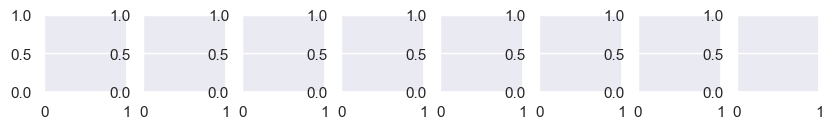

In [851]:
fig, ax = plt.subplots(1, 8, figsize = (10, 1))
for n, i in enumerate(file.spectral_tuning_functions()):
    
    print(n, i)

In [802]:
((((all_r + all_g > 0) * (all_u  < 0)) * (all_b > 0)) + (((all_r + all_g < 0) * (all_u > 0)) * (all_b < 0)))

array([False, False, False, False, False, False, False, False, False,
       False, False,  True,  True,  True, False,  True, False, False,
       False])

# Distances

[[ 7.61439556 17.41909244]
 [        nan         nan]
 [ 7.67040984 17.95255796]
 [ 7.71778572 19.97937344]]

[0.17928524 4.67923183]


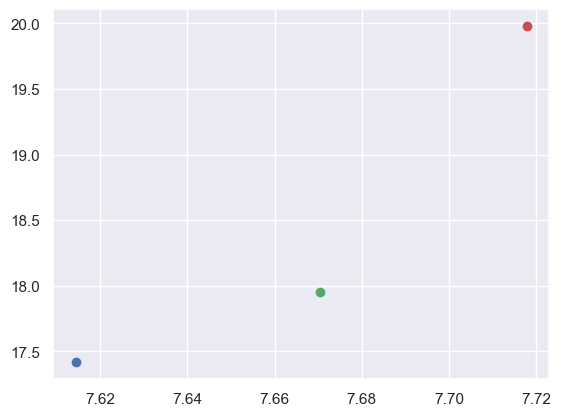

In [190]:
from utilities import multicolour_reshape as reshape
# Get centres of RFs
chroma_centres = reshape(file.contours_centres, 4)
# Calculate the euclidan distances between points, sum them, and take their square roots (vectorized)
distances = np.sqrt(np.nansum((chroma_centres[:, np.newaxis] - chroma_centres) ** 2, axis=(0,1)))

roi = 1
print(chroma_centres[:, roi])
print("")
print(distances[roi])
for i in chroma_centres[:, roi]:
   plt.scatter(i[0], i[1])

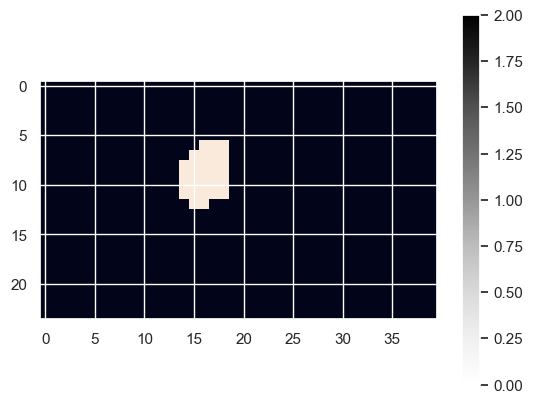

In [221]:
rgbu_masks = utilities.multicolour_reshape(file.rf_masks_combined(), 4)
roi = 1
composit = np.ma.sum(np.ma.abs(rgbu_masks[:, roi][:3]), axis = 0)
plt.imshow(composit, cmap = "Greys", origin = "lower")
plt.colorbar()
"""TODO: Calc LED offset, Roll the UV axis, and get the masks from the corrected
position. Can be implemented under rf_mask and rf_masks_combined via a centre = True arg"""
combined_mask = np.logical_or.reduce(rgbu_masks[:, 13], axis=0)
plt.imshow(combined_mask)

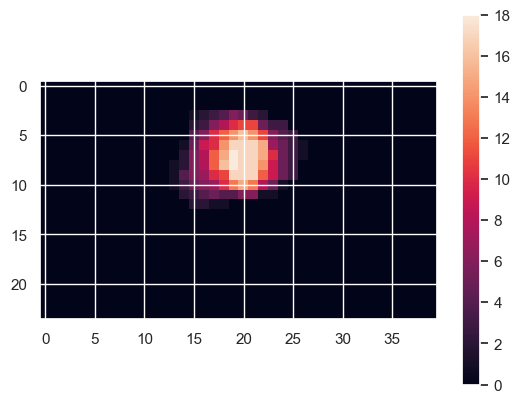

In [293]:
plt.imshow(total_masked_values)
plt.colorbar()

In [300]:
rgbu_masks.shape

(4, 19, 24, 40)

In [326]:
# Combine the masks into a single mask (union of all masks) across the first axis
combined_mask = np.logical_or.reduce(rgbu_masks, axis=0)
a = np.divide(combined_mask, rgbu_masks)
a.shape

C:\Users\SimenLab\AppData\Local\Temp\ipykernel_27388\4269975584.py:3: RuntimeWarning: divide by zero encountered in divide
  a = np.divide(combined_mask, rgbu_masks)
C:\Users\SimenLab\AppData\Local\Temp\ipykernel_27388\4269975584.py:3: RuntimeWarning: invalid value encountered in divide
  a = np.divide(combined_mask, rgbu_masks)


(4, 19, 24, 40)

In [323]:
plotting.play_movie(a[2])

In [43]:
contouring.contour_mask(cont, (20, 20))

TypeError: cannot unpack non-iterable numpy.float64 object

In [41]:
contouring.PolyArea(cont)

16.366978082713104

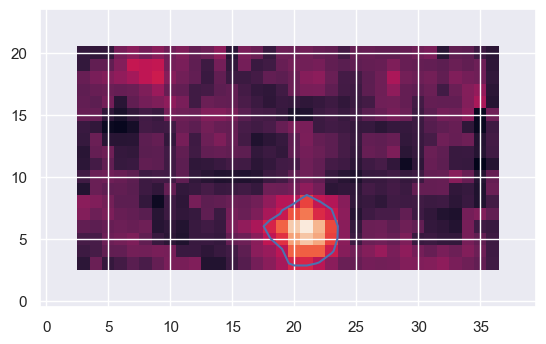

In [36]:
plt.imshow(file.collapse_times()[0], origin = "lower")
plt.plot(file.contours[0][1][0][:, 1], file.contours[0][1][0][:, 0])

    

# Quantifiying contour metrics
Set up contours

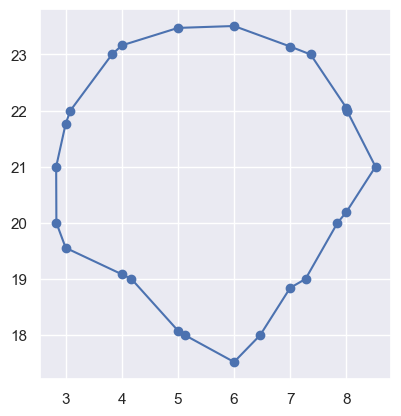

In [43]:
cont = np.array([[ 8.01059558, 22.        ],
       [ 8.52003247, 21.        ],
       [ 8.        , 20.19207544],
       [ 7.84261908, 20.        ],
       [ 7.27310712, 19.        ],
       [ 7.        , 18.8422796 ],
       [ 6.46530883, 18.        ],
       [ 6.        , 17.52089229],
       [ 5.12313315, 18.        ],
       [ 5.        , 18.08003132],
       [ 4.17210047, 19.        ],
       [ 4.        , 19.08418741],
       [ 3.        , 19.55497356],
       [ 2.83450045, 20.        ],
       [ 2.83045875, 21.        ],
       [ 3.        , 21.76650371],
       [ 3.08367009, 22.        ],
       [ 3.82419927, 23.        ],
       [ 4.        , 23.16142232],
       [ 5.        , 23.47309115],
       [ 6.        , 23.50703843],
       [ 7.        , 23.14136373],
       [ 7.36358548, 23.        ],
       [ 8.        , 22.04998467],
       [ 8.01059558, 22.        ]])


# cont = np.array([[13.        , 20.89205572],
#        [12.79352246, 21.        ],
#        [12.        , 21.24486337],
#        [11.55525665, 22.        ],
#        [11.        , 22.27025922],
#        [10.        , 22.91032193],
#        [ 9.88212962, 23.        ],
#        [ 9.        , 23.81461183],
#        [ 8.        , 23.53247799],
#        [ 7.        , 23.29731078],
#        [ 6.49481454, 23.        ],
#        [ 6.05296169, 22.        ],
#        [ 6.        , 21.97089674],
#        [ 5.        , 21.28624084],
#        [ 4.10028128, 22.        ],
#        [ 4.        , 22.05180074],
#        [ 3.95243908, 22.        ],
#        [ 3.        , 21.03389928],
#        [ 2.98501259, 21.        ],
#        [ 2.89624702, 20.        ],
#        [ 3.        , 19.47770274],
#        [ 3.4112709 , 19.        ],
#        [ 4.        , 18.63333302],
#        [ 5.        , 18.94553749],
#        [ 5.3450774 , 18.        ],
#        [ 5.57763215, 17.        ],
#        [ 5.87608693, 16.        ],
#        [ 6.        , 15.56973473],
#        [ 6.36356567, 16.        ],
#        [ 7.        , 16.29959836],
#        [ 7.95692792, 17.        ],
#        [ 7.49734809, 18.        ],
#        [ 8.        , 18.29146979],
#        [ 8.4581835 , 18.        ],
#        [ 8.04218391, 17.        ],
#        [ 9.        , 16.42502474],
#        [ 9.59235474, 17.        ],
#        [ 9.46923659, 18.        ],
#        [10.        , 18.39877961],
#        [11.        , 18.60382009],
#        [12.        , 18.95915132],
#        [13.        , 18.95454507],
#        [13.24486286, 19.        ],
#        [13.17774047, 20.        ],
#        [13.        , 20.89205572]])

# cont = np.array([[0, .6],
#                 [0, 1],
#                 [1, 1],
#                 [1, 2],
#                 [1.25, 1],
#                 [2, .5],
#                 # [1.25, .75],
#                 [1, 0],
#                 [.8, .5],
#                 [.56, 0],
#                 [.1, .2],
#                 [.75, .75],
#                 [0, .6]])

# cont = np.flip(cont, axis = 0)
 
plt.scatter(cont[:, 0], cont[:, 1])
plt.plot(cont[:, 0], cont[:, 1])
plt.gca().set_aspect('equal')


In [44]:
contouring.measures_demo(cont)

NameError: name 'plt' is not defined

# Functions to process contours

This next function computes a bunch of things, one of which is "notches_norm". It is an essential metric for describing the complextiy of a conotur (1 is many notches, 0 is no notches)

## Implementaiton
Taken from the Complexity paper. Goes as follows:

In [211]:
def _extend_2darray(arr_2d):
    """arr_2d is 2d list of points"""
    return np.append(arr_2d[:-1], arr_2d[:3,], axis = 0)

def rotation_direction(coordinates):
    """
    Determine the rotation direction of a sequence of 2D coordinates.
    
    Args:
        coordinates (numpy.ndarray): An array of shape (n, 2) representing the 2D coordinates.
        
    Returns:
        int: -1, 1, or 0. -1 is counterclockwise. 1 is clockwise. 0 is no rotation. 
    """
    # Ensure we have at least 3 coordinates for meaningful rotation analysis
    if len(coordinates) < 3:
        raise ValueError("At least 3 coordinates are required")
    coordinates = np.array(coordinates)
    # Compute the vectors between consecutive points
    v1 = coordinates[1:] - coordinates[:-1]
    # Roll the vectors to align them with the next points
    v2 = np.roll(v1, -1, axis=0)
    # Compute the cross products for all pairs of vectors
    cross_products = np.cross(v1, v2)
    # Calculate the total cross product
    total_cross_product = np.sum(cross_products)
    # Return
    if total_cross_product > 0:
        # Counterclockwise
        return -1
    elif total_cross_product < 0:
        # Clockwise
        return 1
    else:
        # No rotation
        return 0

def calculate_interior_angles(vertices):
    vertices = vertices[1:]
    shifted_vertices = np.roll(vertices, shift=1, axis=0)
    angle_vectors1 = shifted_vertices - vertices
    angle_vectors2 = np.roll(vertices, shift=-1, axis=0) - vertices
    
    cross_product_mag = angle_vectors1[:, 0] * angle_vectors2[:, 1] - angle_vectors1[:, 1] * angle_vectors2[:, 0]
    dot_product = angle_vectors1[:, 0] * angle_vectors2[:, 0] + angle_vectors1[:, 1] * angle_vectors2[:, 1]
    
    angles_radians = np.arctan2(cross_product_mag, dot_product)
    negative_angles = angles_radians < 0
    angles_radians[negative_angles] += 2 * np.pi
    
    return angles_radians

def get_vertex_points(arr_2d):
    """arr_2d is 2d list of points"""
    extended_arr = _extend_2darray(arr_2d)
    return np.array([extended_arr[n:n+3] for n, vertex in enumerate(extended_arr)][:-3])

# def calc_vertex_angles(arr_2d):
#     _vertex_points = get_vertex_points(arr_2d)
#     return np.array([calculate_interior_angle(i[0], i[1], i[2]) for i in _vertex_points])    

def calc_notches_norm(arr_2d):
    return contour_metrics(arr_2d)[-1]

def get_convex_hull(arr_2d):
    """
    Cite:   Barber, C.B., Dobkin, D.P., and Huhdanpaa, H.T., "The Quickhull 
        algorithm for convex hulls," ACM Trans. on Mathematical Software,
        22(4):469-483, Dec 1996, http://www.qhull.org.
    """
    rotation_input_array = rotation_direction(arr_2d)
    _hull = scipy.spatial.ConvexHull(arr_2d) #QHull
    _convex_hull = arr_2d[_hull.vertices]
    _convex_hull = np.append(_convex_hull, np.expand_dims(_convex_hull[0], axis = 0), axis = 0)
    rotation_output_array = rotation_direction(_convex_hull)
    if rotation_input_array != rotation_output_array:
        return np.flip(_convex_hull, axis = 0)
    return _convex_hull

def PolyArea(vertices):
    x,y = vertices[:, 0], vertices[:, 1]
    #Shoelace formula
    return 0.5*np.abs(np.dot(x,np.roll(y,1))-np.dot(y,np.roll(x,1)))

def PolyPerimeter(vertices):
    vertices = np.array(vertices)  # Convert to NumPy array
    shifted_vertices = np.roll(vertices, shift=-1, axis=0)  # Shift vertices for edge pairing
    # Calculate edge lengths per vertex and sum them
    perimeter = np.sum(np.linalg.norm(shifted_vertices - vertices, axis=1))  
    return perimeter

def contour_metrics(arr_2d):
    flip_bool = 0
    _vertex_points =  get_vertex_points(arr_2d)
    try:
        if rotation_direction(arr_2d) == -1:
            flip_bool = 1
            arr_2d = np.flip(arr_2d, axis = 1)
    except ValueError:
        warnings.warn("Not enough points (< 3) to generate metrics")
        return (np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan)
    _vertex_angles = calculate_interior_angles(arr_2d)        
    _notch_bool = _vertex_angles > np.pi
    _num_notches = _notch_bool.sum()
    _num_verteces = len(_vertex_points)
    _area_contour = PolyArea(arr_2d)
    _perimeter_contour = PolyPerimeter(arr_2d)
    return _num_verteces, _vertex_angles, _vertex_points, _notch_bool, _num_notches, _area_contour, _perimeter_contour

def complexity_metrics(arr_2d):
    if type(arr_2d) == list:
        arr_2d = np.array(arr_2d)
    if arr_2d.size == 0:
        return np.nan, np.nan, np.nan, np.nan, np.nan
    # Get base metrics
    _num_verteces, _vertex_angles, _vertex_points, _notch_bool, _num_notches, _area_contour, _perimeter_contour = contour_metrics(arr_2d)
    if np.isnan(_num_verteces) is True: # checking only the first but shoudl be fine 
        # If all is nan, don't bother computing the rest --> just give nans 
        return np.nan, np.nan, np.nan, np.nan, np.nan
    # Create a convex hull and derive area/perimeter for both contour and its convex hull
    _convex_hull = get_convex_hull(arr_2d)
    _area_convex_hull = PolyArea(_convex_hull)
    # _perimeter_contour = PolyPerimeter(arr_2d)
    _perimeter_convex_hull = PolyPerimeter(_convex_hull)
    # Derive complexity measures
    _nothces_norm = _num_notches / (_num_verteces - 3)
    _amplitude_poly = (_perimeter_contour - _perimeter_convex_hull) / _perimeter_contour
    _frequency_poly = 16*(_nothces_norm-0.5)**4 - 8*(_nothces_norm-0.5)**2 + 1
    _convexity_poly = (_area_convex_hull - _area_contour) / _area_convex_hull
    _complexity_poly = 0.8 * _amplitude_poly * _frequency_poly + 0.2 * _convexity_poly
    return _nothces_norm, _amplitude_poly, _frequency_poly, _convexity_poly, _complexity_poly

def measures_demo(arr_2d, vertex_num = -1):
    # cont = arr_2d
    num_verteces, vertex_angles, vertex_points, notch_bool, num_notches, _area_contour, _perimeter_contour = contour_metrics(arr_2d)
    nothces_norm, amplitude_poly, frequency_poly, convexity_poly, complexity_poly = complexity_metrics(arr_2d)
    plt.scatter(arr_2d[:, 0], arr_2d[:, 1])
    plt.scatter(arr_2d[1:, 0][notch_bool == 1], arr_2d[1:, 1][notch_bool == 1], c = "orange", label = "notches")
    plt.plot(arr_2d[:, 0], arr_2d[:, 1])
    plt.scatter(arr_2d[:, 0][0], arr_2d[:, 1][0], c ="red", marker ="v", label = "start point")
    if vertex_num != -1:
        point = vertex_num
        plt.scatter(vertex_points[point][:, 0], vertex_points[point][:, 1], facecolors='none',edgecolors=['green', 'limegreen', 'green'],s =100, lw=3, label = "curr_vertex")
    convex_hull = get_convex_hull(arr_2d)
    plt.plot(convex_hull[:, 0], convex_hull[:, 1], "--k", label = "convex_hull")
    plt.title(f"Complexity = {np.round(complexity_poly, 4)}")
    plt.gca().set_aspect('equal')
    plt.legend()

def metrics_multicontour(list_of_list):
    metrics = []
    for i in list_of_list:
        complexity = complexity_metrics(i)[-1]
        metrics.append(complexity)
    if metrics == []:
        metrics = [np.nan]
    return np.array(metrics)

def complexity_allcontours(contours_tup):
    roi_results = []
    for n, (i, j) in enumerate(zip(contours_tup[:, 0], contours_tup[:, 1])):
        metric_tup = [metrics_multicontour(i), metrics_multicontour(j)]
        roi_results.append(metric_tup)
    return roi_results

def complexity_weighted(contours_tup, contour_areas = file.contours_area):
    final_complexity_metric = []    
    for n, ((neg_comp, pos_comp), (neg_areas, pos_areas)) in enumerate(zip(complexity_allcontours(file.contours), contour_areas)):
        area_weighted_pos_comp = np.nan
        area_weighted_neg_comp = np.nan
        if np.all(neg_areas != np.nan) and np.all(neg_areas>0):
            area_weighted_neg_comp = np.average(neg_comp, weights = np.nan_to_num(neg_areas))
            # print(n, "before:", neg_comp, "after:", np.round(area_weighted_neg_comp, 4))
        if np.all(pos_areas != np.nan) and np.all(pos_areas>0):
            area_weighted_pos_comp = np.average(pos_comp, weights = np.nan_to_num(pos_areas))
            # print(n, "before:", pos_comp, "after:", np.round(area_weighted_pos_comp, 4))
        final_complexity_metric.append((area_weighted_neg_comp, area_weighted_pos_comp))
    return np.array(final_complexity_metric)

## Implementaiton
Taken from the Complexity paper. Goes as follows:

In [80]:
num_verteces, vertex_angles, vertex_points, notch_bool, num_notches, area, perimiter = contour_metrics(cont)
nothces_norm, amplitude, frequency, convexity, complexity = complexity_metrics(cont)
print("Notchnorm", nothces_norm)
print("Ampl:", amplitude)
print("Freq:", frequency)
print("Conv:", convexity)
print("Compl:", complexity)

Notchnorm 0.23809523809523808
Ampl: 0.004583722007486526
Freq: 0.5265295838668045
Conv: 0.01853027609998257
Compl: 0.005636827412926909


In [88]:
PolyArea(file.contours[:, 0][4][0])

17.976996987569237

# Practical application
Now I need to implement this for each polarity and each contour within that polarity for each ROI in file.contours

In [162]:
file.contours[:, 0][3:5]

array([list([]),
       array([array([[ 7.        , 19.5427654 ],
                     [ 6.80405101, 20.        ],
                     [ 6.06250077, 21.        ],
                     [ 6.        , 21.21517407],
                     [ 5.        , 21.00510862],
                     [ 4.99666914, 21.        ],
                     [ 4.32814916, 20.        ],
                     [ 4.        , 19.57481441],
                     [ 3.37467225, 19.        ],
                     [ 3.20242017, 18.        ],
                     [ 3.        , 17.66261473],
                     [ 2.72308071, 17.        ],
                     [ 2.84785804, 16.        ],
                     [ 3.        , 15.65099677],
                     [ 4.        , 15.39468205],
                     [ 5.        , 15.7878251 ],
                     [ 5.05180328, 16.        ],
                     [ 6.        , 16.4982142 ],
                     [ 7.        , 16.2434293 ],
                     [ 7.31091578, 17.        ],
   

In [210]:


    
a = complexity_weighted(file.contours)
a_avg = np.nanmean(a, axis = 1)
# a_avg

C:\Users\Simen\AppData\Local\Temp\ipykernel_27588\2337254568.py:32: RuntimeWarning: Mean of empty slice
  a_avg = np.nanmean(a, axis = 1)


In [248]:
def metrics_per_contour(contours): # specifically loadfile.contour_metrics
    """
    Remember, the structure is:
    [roi, polarity][contour_num][point]
    """
    neg_cs = contours[:, 0]
    pos_cs = contours[:, 1]
    



In [3]:
file.pval_space[8]

0.95

In [4]:
file.contours[8]

array([list([]), list([])], dtype=object)

In [39]:
file.contours[:, 0][0]

array([], dtype=object)

In [16]:
for i in file.contours[:, 0]:
    print(i)
    print(complexity_metrics(i))

[]


AttributeError: 'list' object has no attribute 'size'

(0.3333333333333333, 0.11700915719275404, 0.7901234567901234, 0.18829611477901467, 0.11162056676159315)


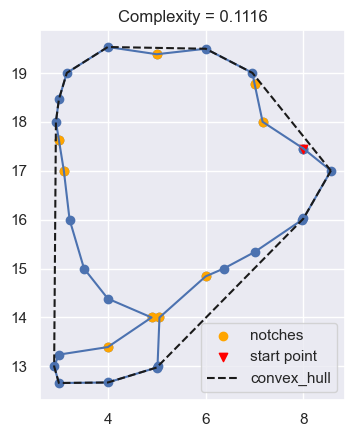

In [277]:
arr = file.contours[65, 0][0]
print(complexity_metrics(arr))
measures_demo(arr)

In [288]:
space.contour_bipolar(file.collapse_times()[0])

c:\Users\SimenLab\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:480: UserWarning: Lower contour did not pass arithmetic threshold criteria (half abs-max = 2.164603710788065)
  contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)


(array([], dtype=object),
 array([array([[ 8.01059558, 22.        ],
               [ 8.52003247, 21.        ],
               [ 8.        , 20.19207544],
               [ 7.84261908, 20.        ],
               [ 7.27310712, 19.        ],
               [ 7.        , 18.8422796 ],
               [ 6.46530883, 18.        ],
               [ 6.        , 17.52089229],
               [ 5.12313315, 18.        ],
               [ 5.        , 18.08003132],
               [ 4.17210047, 19.        ],
               [ 4.        , 19.08418741],
               [ 3.        , 19.55497356],
               [ 2.83450045, 20.        ],
               [ 2.83045875, 21.        ],
               [ 3.        , 21.76650371],
               [ 3.08367009, 22.        ],
               [ 3.82419927, 23.        ],
               [ 4.        , 23.16142232],
               [ 5.        , 23.47309115],
               [ 6.        , 23.50703843],
               [ 7.        , 23.14136373],
               [ 7.36358548,

In [245]:
test = filehandling.load_strf_data(test_path)
# test2 = filehandling.load_strf_data(test2)

C:\Users\SimenLab\AppData\Local\Temp\ipykernel_24956\2652916697.py:1: UserWarning: Rotation detected and corrected for D:\Igor analyses\230613\0_1_ColorSWN_200_0\2023-6-13_Testimport_200.h5
  test = filehandling.load_strf_data(test_path)
C:\Users\SimenLab\AppData\Local\Temp\ipykernel_24956\2652916697.py:1: UserWarning: HDF5 key 'Positions' not found for file D:\Igor analyses\230613\0_1_ColorSWN_200_0\2023-6-13_Testimport_200.h5
  test = filehandling.load_strf_data(test_path)


In [246]:
timevals = test.pval_time
spacevals = test.pval_space

Text(0.5, 0.98, 'Correlation between Time and Space bootstrap p-vals')

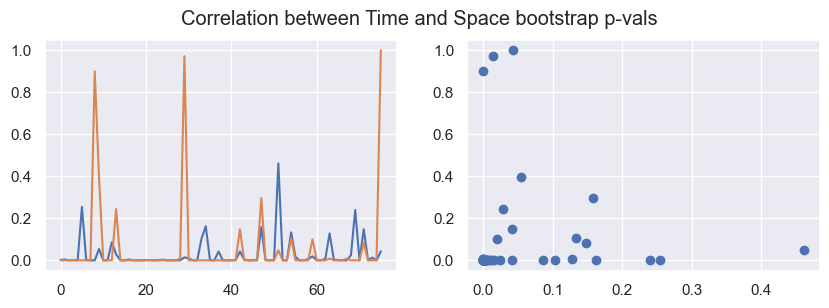

In [272]:
fig, ax = plt.subplots(1, 2, figsize = (10, 3))
ax[0].plot(timevals)
ax[0].plot(spacevals)
ax[1].scatter(timevals, spacevals)
plt.suptitle("Correlation between Time and Space bootstrap p-vals")

In [114]:
arr = file.strfs[51]
sig_space = signal_analysis.bootstrap_space(arr, plot = False, bootstrap_n=2500, metric=np.max)

Spatial pval
-Pass 0.0
Timecourse pval
-Pass 0.0019999999999998908


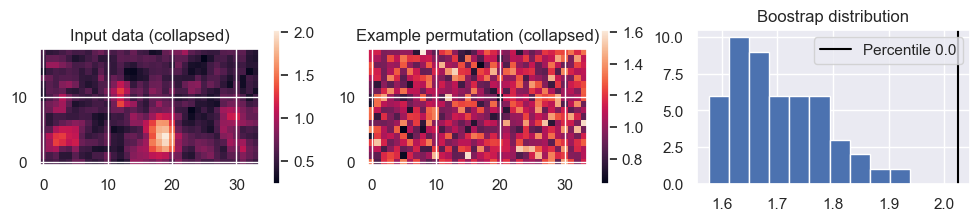

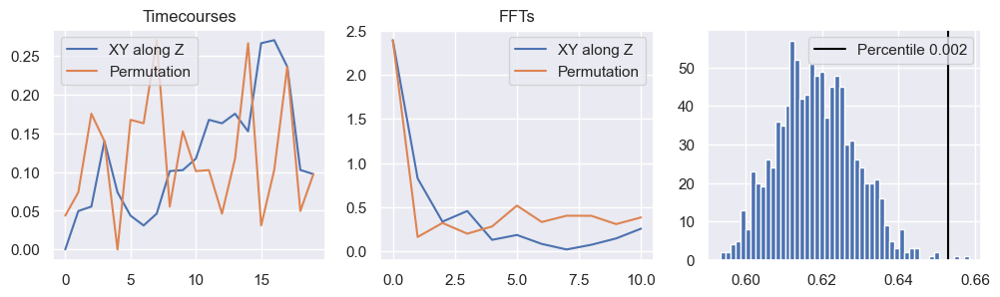

In [242]:
# Parameter testing
arr = file.strfs[1]
sig_space = signal_analysis.bootstrap_space(arr, plot = True, bootstrap_n=50, metric=np.max)
print("Spatial pval")
if sig_space > 0.05:
    print("-Reject", sig_space)
else:
    print("-Pass", sig_space)

sig_time = signal_analysis.bootstrap_time((arr), plot = True, 
    collapse_space=np.std, metric = np.std, bootstrap_n=1000)
print("Timecourse pval")
if sig_time > 0.01:
    print("-Reject", sig_time)
else:
    print("-Pass", sig_time)

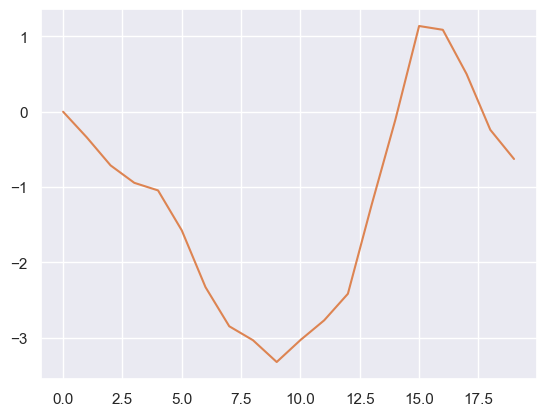

In [14]:
plt.plot(test.timecourses[0].T)

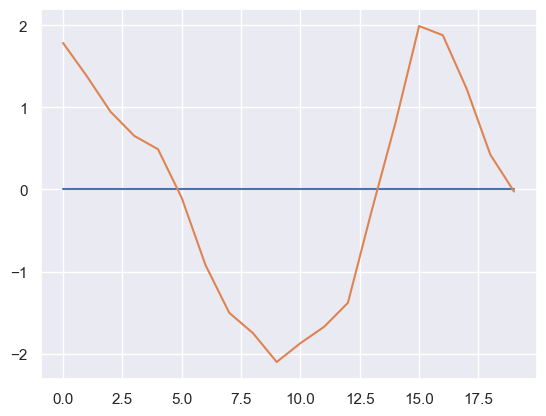

In [15]:
plt.plot(scipy.signal.detrend(test.timecourses[0]).T)

c:\Users\SimenLab\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:476: UserWarning: Lower contour did not pass arithmetic threshold criteria (half abs-max = 17.78736677571082)
  contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)


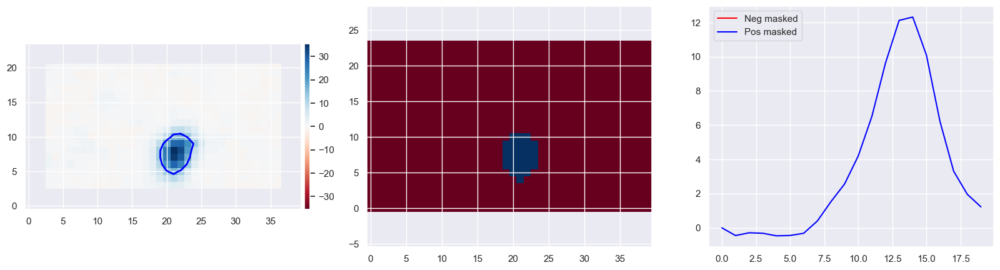

In [3]:
plotting.contouring(test.strfs[2])

Need one more criteria... One that looks at the entire array, or maybe the correlation in time or smth, and decided whether the array is noise or signal... See example test.strfs[54] or 64

This works nicely: (although see nr 51, interestingly JUST on the edge)

In [5]:
data = arr
data = np.var(utilities.auto_remove_border(data.data), axis = 0)
data_flat = (data.flatten(), )
res = scipy.stats.bootstrap(data_flat, np.std)
res

c:\Users\SimenLab\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\utilities.py:133: UserWarning: Destructive method. You lose data, with no way of recovering original shape!
  warnings.warn("Destructive method. You lose data, with no way of recovering original shape!")


BootstrapResult(confidence_interval=ConfidenceInterval(low=3.5915581757649346, high=5.530118946610638), bootstrap_distribution=array([4.55744715, 4.34771866, 4.92350735, ..., 4.51158943, 5.11435485,
       4.6674677 ]), standard_error=0.48924520630152624)

In [22]:

arr = test.strfs[2]

In [25]:
arr.shape
rng = np.random.default_rng()
arr = utilities.auto_remove_border(arr.data)

c:\Users\SimenLab\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\utilities.py:133: UserWarning: Destructive method. You lose data, with no way of recovering original shape!
  warnings.warn("Destructive method. You lose data, with no way of recovering original shape!")


In [62]:
np.stack([arr] * 10).shape

(10, 20, 18, 34)

In [92]:
plotting.play_movie(permuted_stack[0])

In [50]:
1- scipy.stats.percentileofscore(res, np.var(np.var(test.strfs[0], axis = 0))) / 100

1.0

In [71]:
correctly_reshaped.shape

(20, 18, 34, 100)

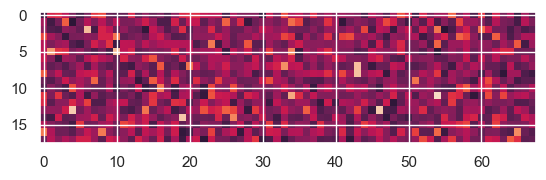

In [47]:
plt.imshow(np.var(permuted_thing, axis = 0))
plt.clim(0, 3)

In [17]:
plotting.play_movie((permuted_thing))

array([3.07305412, 3.32911331])

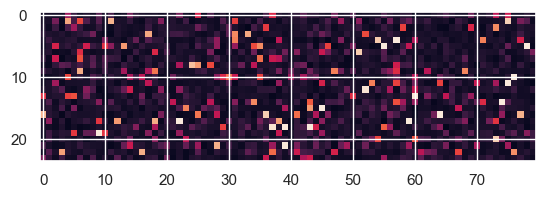

In [216]:
plt.imshow(np.var(permuted_thing, axis = 0))
plt.clim(0, 10)

In [28]:
timevals = []
spacevals = []
for i in range(50):
    time_pval = signal_analysis.bootstrap_time((arr), plot = False, 
        collapse_space=np.std, metric = np.var, bootstrap_n=1000)
    space_pval = signal_analysis.bootstrap_space(arr, plot = False, bootstrap_n=250)
    timevals.append(time_pval)
    spacevals.append(space_pval)
    

5.6839999999994e-07
4.7110399999999955e-05


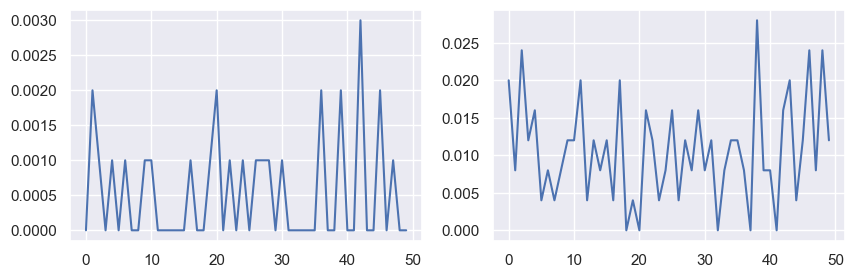

In [29]:
fig, ax = plt.subplots(1, 2, figsize = (10, 3))
ax[0].plot(timevals)
ax[1].plot(spacevals)
print(np.var(timevals))
print(np.var(spacevals))

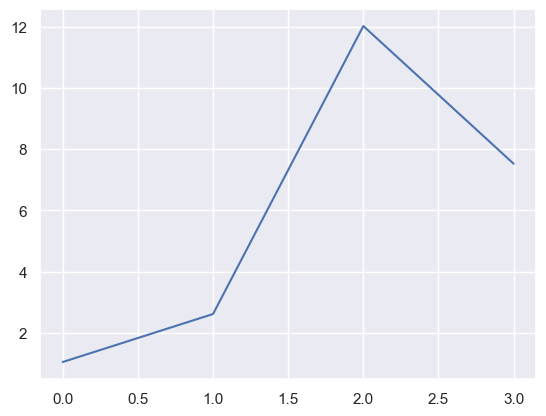

In [4]:
raw_peaks = np.max(utilities.multicolour_reshape(test.timecourses, 4)[:, 0, 1], axis = 1)
plt.plot(raw_peaks)
# plt.plot(raw_peaks.data)

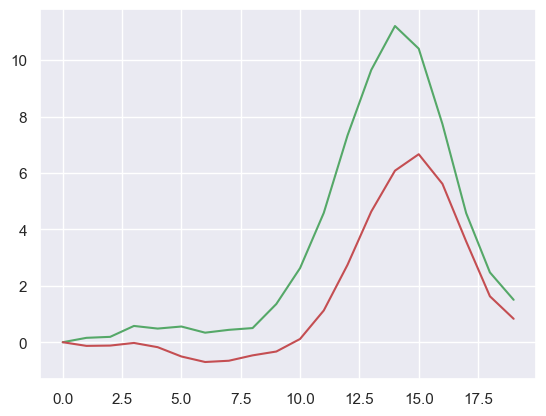

In [2338]:
plt.plot(utilities.multicolour_reshape(test.timecourses, 4)[:, 1, 1].T)

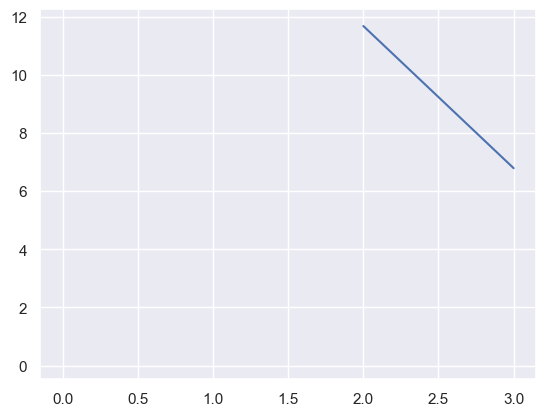

In [6]:
raw_peaks = np.max(utilities.multicolour_reshape(test.timecourses, 4)[:, 1, 1], axis = 1)
plt.plot(raw_peaks)
# plt.plot(raw_peaks.data)

c:\Users\SimenLab\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:476: UserWarning: Lower contour did not pass arithmetic threshold criteria (half abs-max = 2.164603710788065)
  contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)
c:\Users\SimenLab\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:476: UserWarning: Lower contour did not pass arithmetic threshold criteria (half abs-max = 2.048971428246694)
  contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)
c:\Users\SimenLab\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:476: UserWarning: Lower contour did not pass arithmetic threshold criteria (half abs-max = 17.78736677571082)
  contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)
c:\Users\SimenLab\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:476: UserWarning: Lower contour did not pass arithmetic threshold criteria (half abs-max = 10.110173676257793)
  contour_lower, con

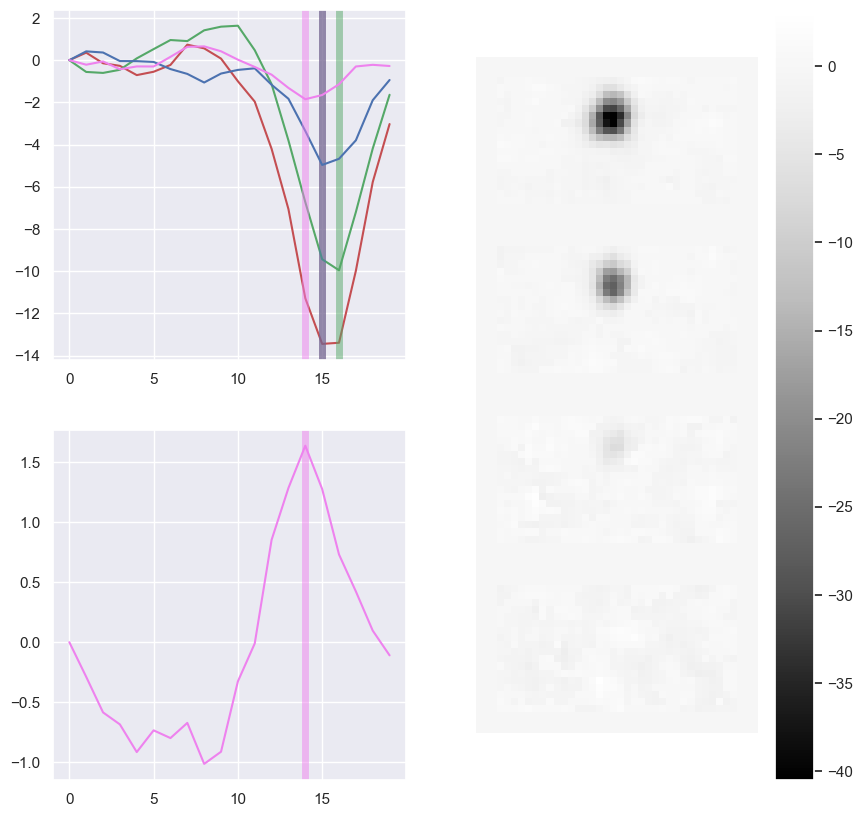

In [2290]:

roi = 15
times = test.timecourses.reshape(4, 19, 2, 20, order = 'f')
spaces = test.collapse_times().reshape(4, 19, 24, 40, order = 'f') # this works

fig, ax = plt.subplot_mosaic([[0, 2], [1, 2]], figsize = (10, 10))
colours = ["r", "g", "b", "violet"]
for n, i in enumerate(times[:, roi, 0]):
    min_time = np.argmin(i)
    if min_time > 0:
        ax[0].axvline(min_time, c = colours[n], lw = 5, alpha = 0.5)
    ax[0].plot(i.T, color = colours[n])
for m, j in enumerate(times[:, roi, 1]):
    max_time = np.argmax(j)
    if max_time > 0:
        ax[1].axvline(max_time, c = colours[m], lw = 5, alpha = 0.5)
    ax[1].plot(j.T, color = colours[m])
summary = ax[2].imshow(np.concatenate(spaces[:, roi]), cmap = 'Greys_r')
ax[2].axis('off')
fig.colorbar(summary, ax=ax[2])

# ax["left"].set_title("OFFs")
# ax["right"].set_title("ONs")


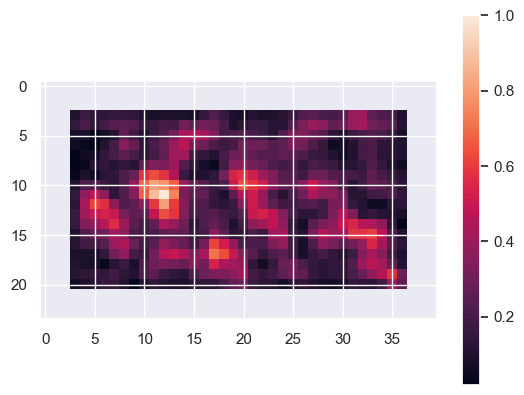

In [142]:
plt.imshow(space._legacy_corr_spacetime(test.strfs[63]))
plt.colorbar()

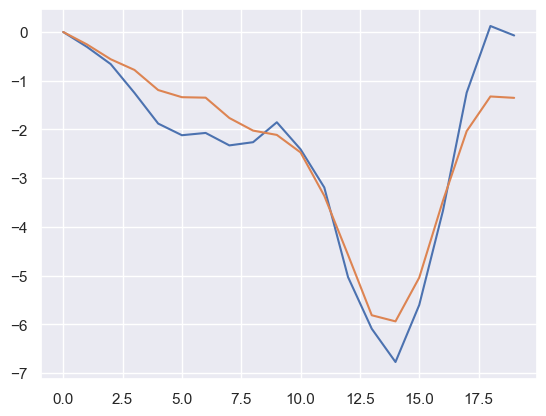

In [10]:
roi = 4
plt.plot(test.timecourses[roi, 1])
plt.plot(test.timecourses[roi, 0])

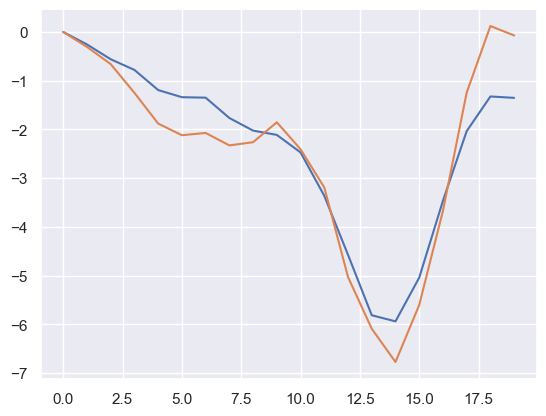

In [11]:
roi = 4
a = temporal.extract_timecourse(test.strfs[4])
plt.plot(a.T)

Bug in two polarities comes from STRF masking. It happens when contours are drawn on time-collapsed STRF which yields mixed polarity (incorrectly) in the 2D array... 

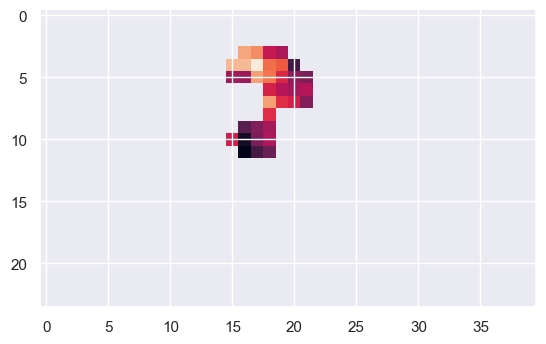

In [12]:
plt.imshow(test.strf_masks[4, 0, 0])

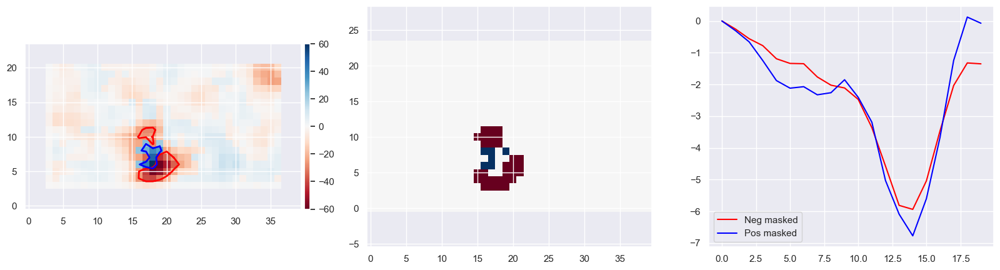

In [13]:
plotting.contouring(test.strfs[4])

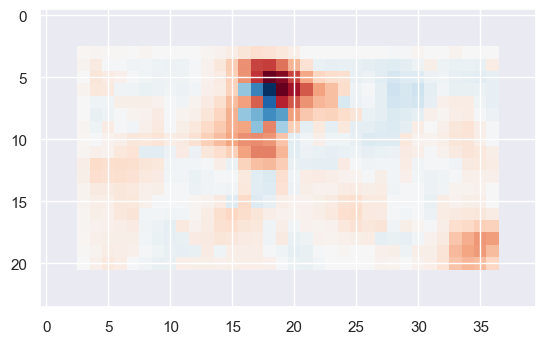

In [14]:
plt.imshow(test.collapse_times()[4], cmap = 'RdBu')

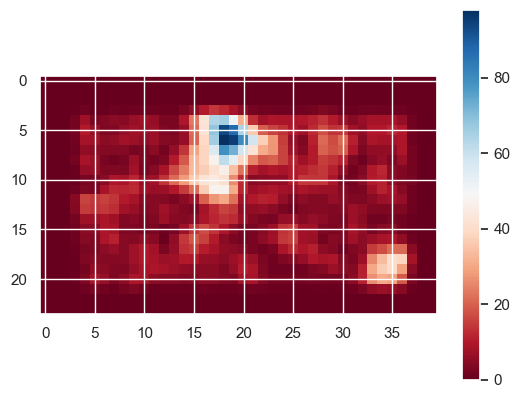

In [15]:
plt.imshow(space.corr_spacetime(test.strfs[4]), cmap = 'RdBu')
plt.colorbar()

#  * space.pixel_polarity(test.strfs[4], (3, 3))

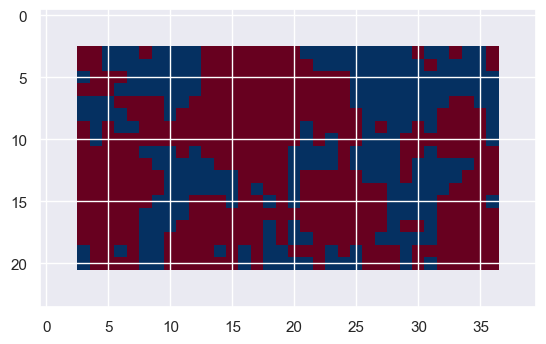

In [16]:
plt.imshow(space.pixel_polarity(test.strfs[4], (1, 3)), cmap = 'RdBu')


In [17]:
plotting.play_movie(test.strfs[4])

C:\Users\Simen\AppData\Local\Temp\ipykernel_23748\680775175.py:6: UserWarning: Rotation detected and corrected for C:\Users\Simen\Downloads\2023-5-2_SMP_0_0_SWN_UV_100_0.h5
  Data = filehandling.load_strf_data(file_path)
c:\Users\Simen\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:438: UserWarning: Lower contour did not pass threshold criteria
  contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)
c:\Users\Simen\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:438: UserWarning: Upper contour did not pass threshold criteria
  contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)


(array([0.]), array([14.44488019]))

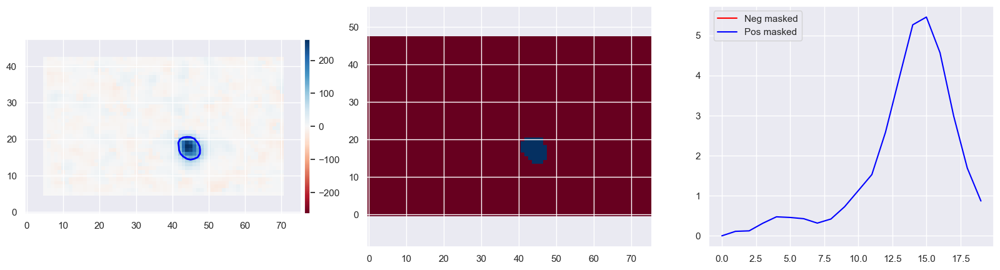

In [154]:
# file_path = r"D:\Igor analyses\230119\2023-1-19_SMP_0_3_RG_SWN_200_5Hz_0_R.h5"
file_path = r"C:\Users\Simen\Downloads\2023-5-2_SMP_0_0_SWN_UV_100_0.h5"
file_path
roi = 3
# Get the data
Data = filehandling.load_strf_data(file_path)
# # Get contours
neg_contour, pos_contours = Data.contours[roi]
plotting.contouring(Data.strfs[roi])
area_low, area_high = Data.contours_area[roi]
area_low_converted = unit_conversion.area_conversion(area_low, 200, 4)
area_high_converted = unit_conversion.area_conversion(area_high, 200, 4)
np.sqrt(area_low_converted/np.pi), np.sqrt(area_high_converted/np.pi)

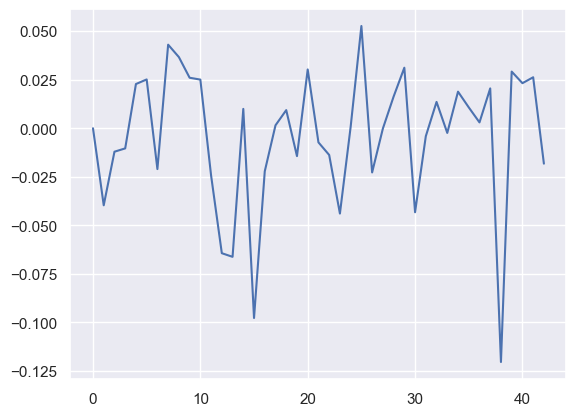

In [191]:
plt.plot(np.mean(Data.strfs, axis = (1, 2,3)))

In [182]:
plotting.play_movie(Data.strfs[1])

In [70]:
img = napari.view_image(Data.images)

In [71]:
img.add_image(Data.rois.T)

<Image layer 'Image [1]' at 0x1d4994fa230>

In [79]:
Data.rois.T

array([[1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 1., 1., ..., 1., 1., 1.]], dtype=float32)

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        ...,
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],
  fill_value=1e+20,
  dtype=float32)

In [12]:
Data = filehandling.load_strf_data(test_path)

C:\Users\SimenLab\AppData\Local\Temp\ipykernel_16908\2768760910.py:1: UserWarning: Rotation detected and corrected for D:\Igor analyses\230614\0_1_ColorSWN_200_0\2023-6-14_SMP_0_2_ColourSWN_200_0.h5
  Data = filehandling.load_strf_data(test_path)


(-0.5, 127.5, -0.5, 63.5)

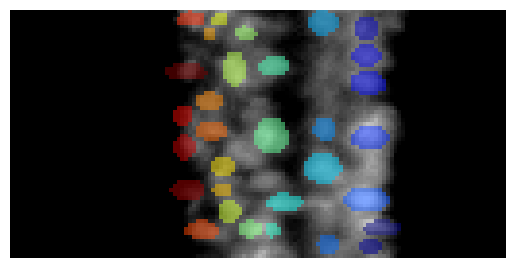

In [13]:
preprocess = utilities.min_max_norm(np.std(Data.images, axis = 0), 0, 255)
plt.imshow(preprocess, origin = "lower", cmap = "Greys_r",
    vmin = 100, vmax = 255)
plt.imshow(np.ma.masked_where(Data.rois.T == 1, Data.rois.T), cmap = "jet", alpha = 0.5, origin = "lower")
plt.axis("off")
# plt.savefig(r"C:\Users\Simen\OneDrive\Universitet\PhD\Conferences\Life Sciences PhD Careers Symposium 2023\ROI_image.svg")

In [134]:
3180 * 15.156

48196.08

In [105]:
napari.view_image(np.ma.masked_where(Data.rois.T == 1, Data.rois.T))

Viewer(axes=Axes(visible=False, labels=True, colored=True, dashed=False, arrows=True), camera=Camera(center=(0.0, 31.5, 63.5), zoom=5.6703125, angles=(0.0, 0.0, 90.0), perspective=0.0, interactive=True), cursor=Cursor(position=(1.0, 1.0), scaled=True, size=1, style=<CursorStyle.STANDARD: 'standard'>), dims=Dims(ndim=2, ndisplay=2, last_used=0, range=((0.0, 64.0, 1.0), (0.0, 128.0, 1.0)), current_step=(32, 64), order=(0, 1), axis_labels=('0', '1')), grid=GridCanvas(stride=1, shape=(-1, -1), enabled=False), layers=[<Image layer 'Image' at 0x1d4a6cfc160>], scale_bar=ScaleBar(visible=False, colored=False, color=array([1., 0., 1., 1.], dtype=float32), ticks=True, position=<Position.BOTTOM_RIGHT: 'bottom_right'>, font_size=10.0, box=False, box_color=array([0. , 0. , 0. , 0.6], dtype=float32), unit=None), text_overlay=TextOverlay(visible=False, color=array([0.5, 0.5, 0.5, 1. ], dtype=float32), font_size=10.0, position=<TextOverlayPosition.TOP_LEFT: 'top_left'>, text=''), overlays=Overlays(int

In [65]:
file_path = r"D:\Igor analyses\230202\2023-2-2_SMP_0_1_R_100_5Hz_0.h5"
all_data = filehandling.load_from_hdf5(file_path)

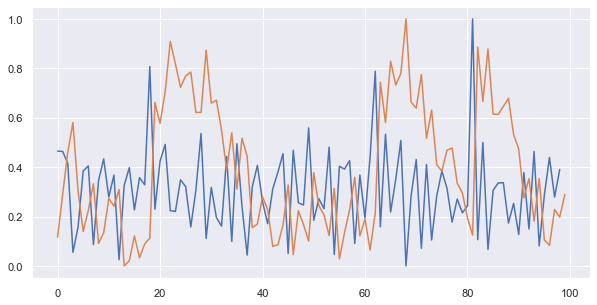

In [127]:
plt.figure(figsize = (10,5))
plt.plot(utilities.min_max_norm(np.diff(all_data.Traces0_raw[2850:2950, 1]), 0, 1))
plt.plot(utilities.min_max_norm(all_data.Traces0_raw[2850:2950, 1], 0, 1))
# plt.savefig(r"C:\Users\SimenLab\OneDrive\Universitet\PhD\Conferences\Life Sciences PhD Careers Symposium 2023\trace_example.svg")

In [110]:
7 * 15.625

109.375

In [87]:
len(all_data.Traces0_raw) / 15.625

538.432

In [120]:
100/15.625

6.4

In [3]:
Data.contours_area[13] # 13

(array([8.23]), array([0]))

In [4]:
area = (14.63 * 9.48**2)/4
area
# 

328.70098800000005

328.9906293161454

C:\Users\SimenLab\AppData\Local\Temp\ipykernel_13420\3591228150.py:41: UserWarning: Keyword arg 'level' specified, ignoring threshold criteria.
  lower_contour, upper_contour =  contour_bipolar(strf, level = (-300, 300))


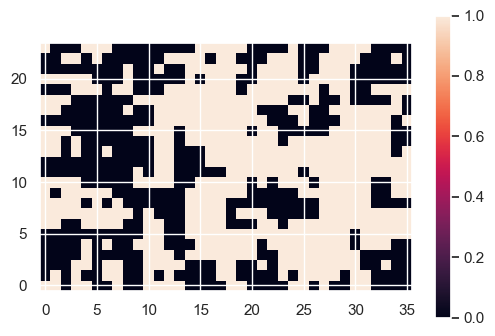

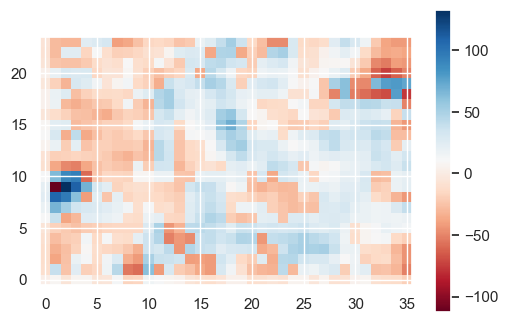

In [305]:
from space import _draw_contour_bipolar, contour_points_QualityControl, abs_criteria_global
def contour_bipolar(arr_2d, abs_criteria = abs_criteria_global, **kwargs):
    """Accessible helper for main function 'contour()'."""
    # Split array into positive and negative components
    arr_2d_lower = np.clip(arr_2d, np.min(arr_2d), -1)
    arr_2d_upper = np.clip(arr_2d, 1, np.max(arr_2d))

    ### EXPERIMENTAL
    # Errode array (note from docu: "Erosion shrinks bright regions and enlarges dark regions")
    # therefore, we must flip it for negative polarity
    arr_2d_lower_erroded = skimage.morphology.erosion(arr_2d_lower*-1, footprint = np.ones((2,2)))
    arr_2d_upper_erroded = skimage.morphology.erosion(arr_2d_upper, footprint = np.ones((2,2)))
    arr_2d_lower_locmax = skimage.morphology.local_maxima(arr_2d_lower)
    #arr_2d_lower_closed = skimage.morphology.diameter_opening(arr_2d)
    plt.imshow(arr_2d_lower_locmax, origin = 'lower')
    plt.colorbar()
    # If level is given, pass it along (behaviour depends on input type)
    if "level" in kwargs:
        warnings.warn("Keyword arg 'level' specified, ignoring threshold criteria.",  stacklevel=2)
        # Only allow "level" to be type tuple for contour_bipolar()
        if type(kwargs["level"]) is float or type(kwargs["level"]) is int:
            raise TypeError("contour_bipolar execpted keyword argument 'level' to be tuple.")
        # if input is tuple, the 0th index is lower contour and 1th index is upper contour,
        # passed to contour_tuple, and returned at end of script
        if type(kwargs["level"]) is tuple:
            contour_lower = skimage.measure.find_contours(arr_2d, level = kwargs["level"][0])
            contour_upper = skimage.measure.find_contours(arr_2d, level = kwargs["level"][1])
    if "level" in kwargs and kwargs["level"] == "scikit-default":
        scikit_contour = skimage.measure.find_contours(arr_2d)
        return scikit_contour
    # If no level is given, compute it
    if "level" not in kwargs:
        contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)
    # Filter the smallest contours 
    contour_lower = contour_points_QualityControl(contour_lower, contour_points_min = 5)
    contour_upper = contour_points_QualityControl(contour_upper, contour_points_min = 5)
    contour_tuple = (contour_lower, contour_upper)
    return contour_tuple

strf = Data.collapse_times()[7]
lower_contour, upper_contour =  contour_bipolar(strf, level = (-300, 300))
fig, ax = plt.subplots()
plt.imshow(strf, cmap = 'RdBu', origin = "lower")
plt.colorbar()
for j in lower_contour:
    ax.plot(j[:, 1], j[:, 0], lw = 2, c = 'red')# contour 
for k in upper_contour:
    ax.plot(k[:, 1], k[:, 0], lw = 2, c = 'blue')# contour

In [131]:
plotting.play_movie(Data.strfs[3])

In [74]:
def numpy_fillna(data):
    if isinstance(data, np.ndarray) is False:
        data = np.array(data, dtype = object)
    # Get lengths of each row of data
    lens = np.array([len(i) for i in data])
    # Mask of valid places in each row
    mask = np.arange(lens.max()) < lens[:,None]
    # Setup output array and put elements from data into masked positions
    out = np.zeros(mask.shape, dtype=data.dtype)
    out[mask] = np.concatenate(data)
    return out

paddedarr = numpy_fillna(Data.contours_area[7])

np.sum(paddedarr, axis = 1)


array([[0.21, 0],
       [5.11, 0.85]], dtype=object)

In [62]:
type(np.array(Data.contours_area[7], dtype = object))

numpy.ndarray

In [53]:
np.array(Data.contours_area[7], dtype = object)

array([array([0.21]), array([5.11, 0.85])], dtype=object)

In [3]:
unit_conversion.au_to_visang(200)

9.484175824175823

In [19]:
areas = Data.contours_area[3] * np.array(unit_conversion.au_to_visang(200))
areas[0]

array([138.75349231])

In [3]:
np.array((16, 20, 60, 80)) - (16, 20, 34, 43)

array([ 0,  0, 26, 37])

In [3]:
Data.strfs[roi].shape

(20, 60, 80)

In [6]:
borders_widths = utilities.check_border(Data.strfs[3][0].mask, expect_symmetry=False)
org_shape_space = np.array(Data.strfs[3][0].shape)
org_shape_time = Data.strfs[3].shape[0]
new_shape = org_shape_space - (borders_widths[0] + borders_widths[1], borders_widths[2] + borders_widths[3])
plotting.play_movie(Data.strfs[3].compressed().reshape(org_shape_time, new_shape[0], new_shape[1]))

In [7]:
borders_widths

(18, 18, 22, 22)

In [19]:
# Get all data outside contour 
mask = Data.rf_masks()[-1]
mask_inv = mask * -1

# raw_data = Data.strfs
mask_inv.shape


(43, 48, 76)

<AxesSubplot: ylabel='Count'>

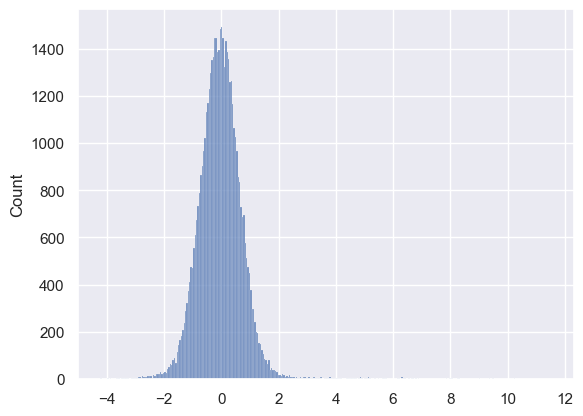

In [8]:
sns.histplot(Data.strfs[-1].flatten())

In [252]:
plotting.play_movie(Data.strfs[roi])

In [130]:
def all_channels(arr3d):
    shape = arr3d.shape
    return arr3d.reshape(shape[0], shape[1] * shape[2])

def stat_contour(arr2d, threshold, stat_type = "stdminmax", modifier = 2):
    if stat_type == "stdminmax":
        max_val = np.max(arr2d)
        min_val = np.min(arr2d)
        print(min_val, min_val < -threshold, max_val, max_val > threshold)
        if min_val < -threshold:
            contour_lower = skimage.measure.find_contours(arr2d, level = min_val/modifier)
        else:
            print("ding")
            contour_lower = []
        if max_val > threshold:
            contour_upper = skimage.measure.find_contours(arr2d, level = max_val/modifier)
        else:
            contour_upper = []
        return contour_lower, contour_upper


strf_num = 5 # -15, -8
thresh = 3
colapsed_scaled = utilities.min_max_norm(Data.collapse_times()[strf_num], np.min(Data.strfs[strf_num]), np.max(Data.strfs[strf_num]))
contour_lower, contour_upper = stat_contour(colapsed_scaled, threshold=1, modifier = 7)

-2.025364875793457 True 5.683825969696045 True


In [281]:
strf = Data.strfs[strf_num]
srf = Data.collapse_times()[strf_num]
np.std(srf)

0.693243516567483

-2.025364875793457 False 5.683825969696045 True
ding


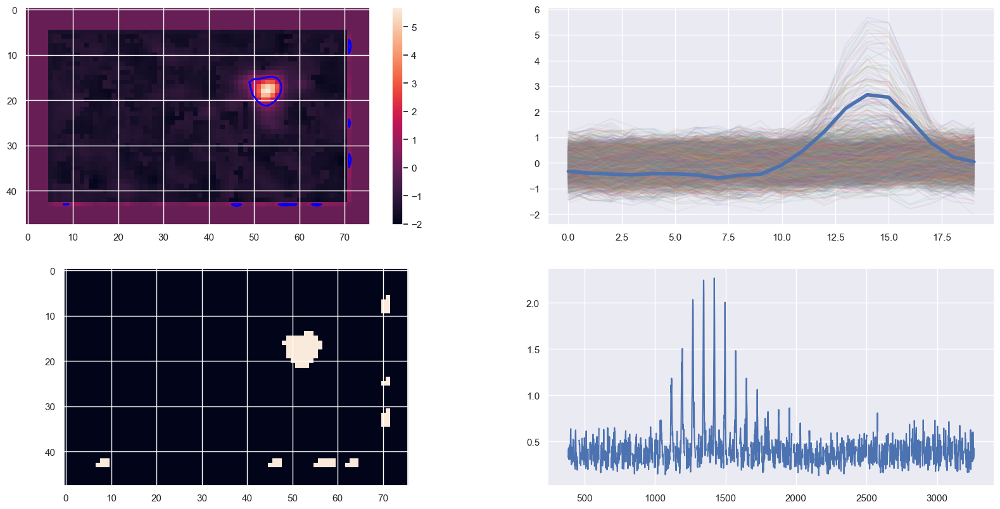

In [131]:


contour_lower, contour_upper = stat_contour(colapsed_scaled, threshold=thresh, modifier = 7)
mask = space.contour_mask((contour_lower, contour_upper), colapsed_scaled.shape)
neg_kernel = np.ma.average(space.rf_mask3d(Data.strfs[strf_num], mask_tup = mask)[0], axis = (1, 2))
pos_kernel = np.ma.average(space.rf_mask3d(Data.strfs[strf_num], mask_tup = mask)[1], axis = (1, 2))
channels = all_channels(Data.strfs[strf_num])
channels_stat = np.std(all_channels(Data.strfs[strf_num]), axis = (0))

fig, ax = plt.subplots(2,2, figsize = (20, 10))
arr2d = ax[0, 0].imshow(colapsed_scaled)
fig.colorbar(arr2d)
ax[0, 1].plot(channels, alpha = 0.1);
for j in contour_lower:
    ax[0, 0].plot(j[:, 1], j[:, 0], lw = 2, c = 'red')# contour 
for j in contour_upper:
    ax[0, 0].plot(j[:, 1], j[:, 0], lw = 2, c = 'blue')# contour 
ax[1, 0].imshow(mask[0]*2 + mask[1]*-2)
ax[1, 1].plot(channels_stat)
ax[0, 1].plot(neg_kernel, lw = 4, c = 'r')
ax[0, 1].plot(pos_kernel, lw = 4, c = 'b')

In [114]:
np.max(channels)

1.0034986

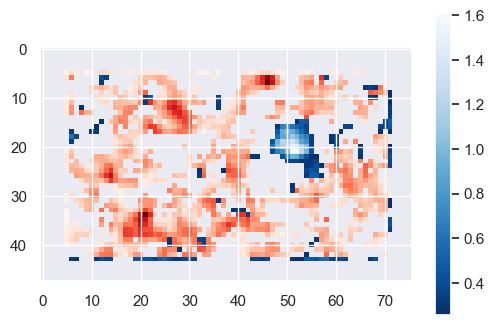

In [129]:
# 3D implementation
neg_std = np.std(np.clip(colapsed_scaled, -10, 0))
pos_std = np.std(np.clip(colapsed_scaled, 0, 10))
neg_std, pos_std

negative_mask = np.ma.masked_where(colapsed_scaled > -neg_std, colapsed_scaled)
positive_mask = np.ma.masked_where(colapsed_scaled < neg_std, colapsed_scaled)
plt.imshow(negative_mask, cmap = 'Reds_r')
plt.imshow(positive_mask, cmap = "Blues_r")
plt.colorbar()

C:\Users\Simen\AppData\Local\Temp\ipykernel_452\1341876016.py:8: RuntimeWarning: divide by zero encountered in divide
  ax[1].imshow(median /frangi)


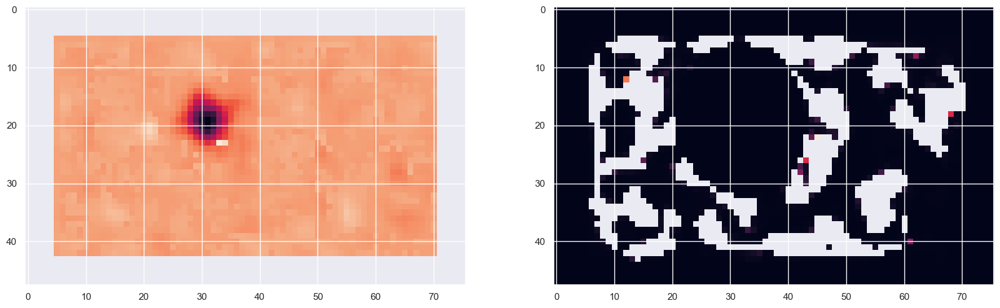

In [7]:
import skimage.filters
fig, ax = plt.subplots(1, 2, figsize = (20, 20))
ax[0].imshow(colapsed_scaled)

median = skimage.filters.median(colapsed_scaled)
frangi = skimage.filters.frangi(median)
sobel = skimage.filters.sobel(colapsed_scaled)
ax[1].imshow(median /frangi)

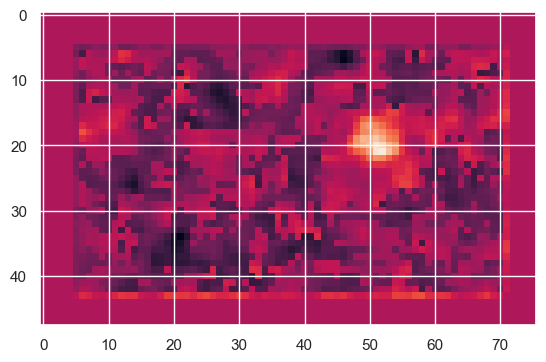

In [270]:
plt.imshow(np.var)

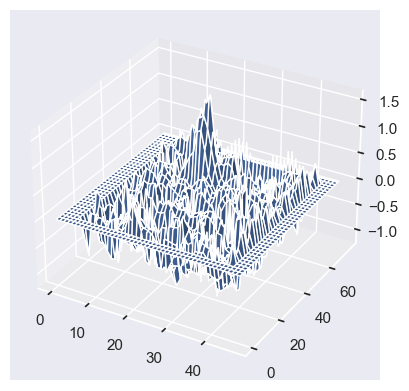

In [220]:
fig, ax = plt.subplots(subplot_kw=dict(projection='3d'))
X, Y = np.meshgrid(np.arange(0,  colapsed_scaled.shape[0]), np.arange(0,  colapsed_scaled.shape[1]))
ax.plot_surface(X, Y, colapsed_scaled.T)

In [213]:
Y

array([[76]])

In [86]:
(all_channels(Data.strfs[strf_num]))

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        ...,
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],
  fill_value=1e+20,
  dtype=float32)

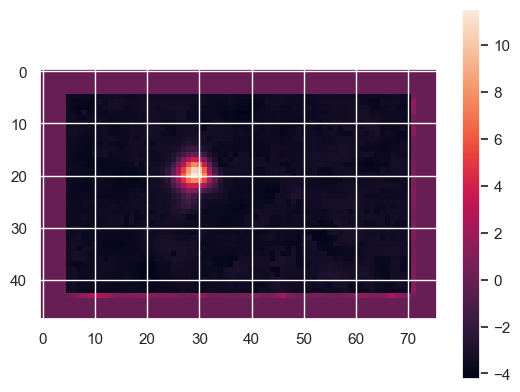

In [143]:
plt.imshow()
plt.colorbar()

In [125]:
top_mask_strf = space.rf_mask3d(Data.strfs[strf_num], mask_tup = mask)[0]
bottom_mask_strf = space.rf_mask3d(Data.strfs[strf_num], mask_tup = mask)[1]
plotting.play_movie(np.ma.array(top_mask_strf.data, mask = top_mask_strf.mask * bottom_mask_strf.mask))

In [ ]:
plotting.play_movie(Data.strfs[strf_num])

c:\Users\Simen\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:477: UserWarning: Keyword arg 'level' specified, ignoring threshold criteria.
  contours_tuple = contour_bipolar(arr_2d, abs_criteria, **kwargs)


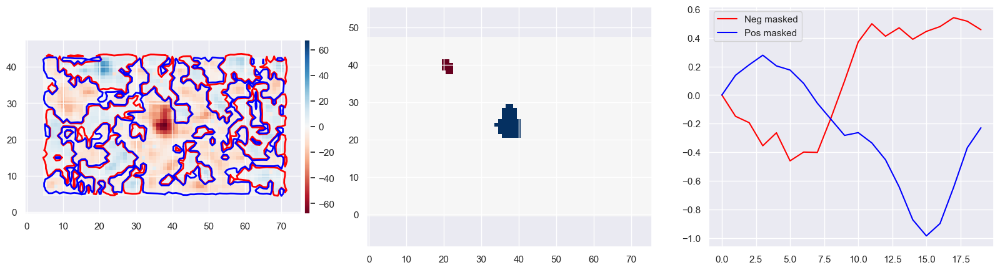

In [211]:
plotting.contouring(Data.strfs[strf_num], level = min_val/2)

In [201]:
plotting.play_movie(Data.strfs[strf_num])

In [153]:
Data.collapse_times()[strf_num].shape

(48, 76)

In [84]:
napari.view_image(Data.collapse_times())

Viewer(axes=Axes(visible=False, labels=True, colored=True, dashed=False, arrows=True), camera=Camera(center=(0.0, 23.5, 37.5), zoom=9.549999999999999, angles=(0.0, 0.0, 90.0), perspective=0.0, interactive=True), cursor=Cursor(position=(21.0, 1.0, 0.0), scaled=True, size=1, style=<CursorStyle.STANDARD: 'standard'>), dims=Dims(ndim=3, ndisplay=2, last_used=0, range=((0.0, 43.0, 1.0), (0.0, 48.0, 1.0), (0.0, 76.0, 1.0)), current_step=(21, 24, 38), order=(0, 1, 2), axis_labels=('0', '1', '2')), grid=GridCanvas(stride=1, shape=(-1, -1), enabled=False), layers=[<Image layer 'Image' at 0x1aef9bb6fe0>], scale_bar=ScaleBar(visible=False, colored=False, color=array([1., 0., 1., 1.], dtype=float32), ticks=True, position=<Position.BOTTOM_RIGHT: 'bottom_right'>, font_size=10.0, box=False, box_color=array([0. , 0. , 0. , 0.6], dtype=float32), unit=None), text_overlay=TextOverlay(visible=False, color=array([0.5, 0.5, 0.5, 1. ], dtype=float32), font_size=10.0, position=<TextOverlayPosition.TOP_LEFT: '

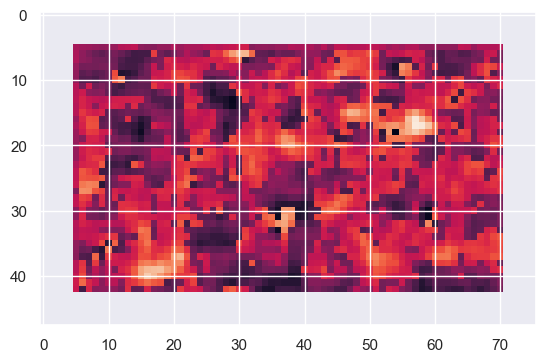

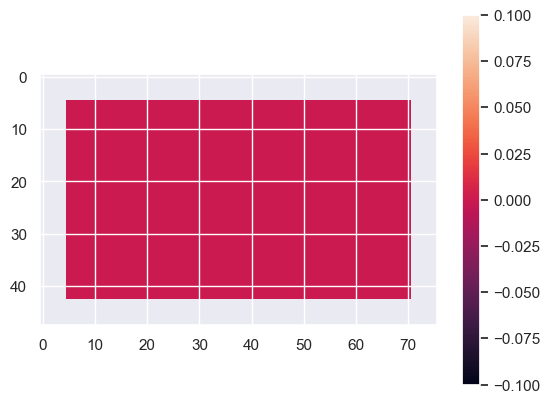

In [ ]:

plt.colorbar()

In [98]:
np.var(pixels_kernels)

0.06878234738640925

In [16]:
Data.strfs[roi].shape

(20, 48, 76)

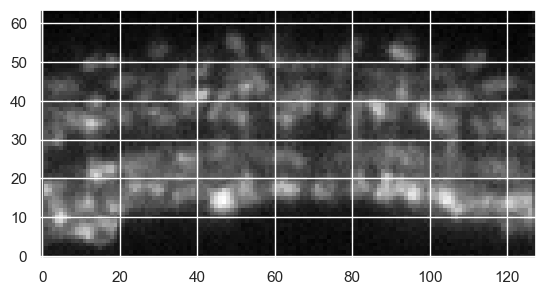

In [24]:
plt.imshow(np.average(Data.images, axis = 0), cmap = 'Greys_r', origin = "lower")

In [103]:
plotting.play_movie(np.average(Data.strfs, axis = 0))
# plt.savefig("gif.tif")

C:\Users\SimenLab\AppData\Local\Temp\ipykernel_14212\1908595064.py:4: UserWarning: HDF5 key 'Positions' not found for file D:\Igor analyses\230502\2023-5-2_SMP_0_0_SWN_UV_50_0.h5
  Data = filehandling.load_strf_data(file_path)


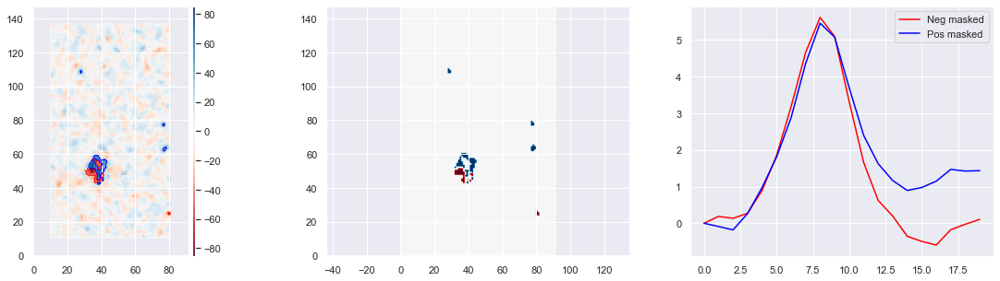

In [6]:
file_path = r"D:\Igor analyses\230502\2023-5-2_SMP_0_0_SWN_UV_50_0.h5"
roi = 2
# Get the data
Data = filehandling.load_strf_data(file_path)
# # Get contours
neg_contour, pos_contours = Data.contours[roi]
plotting.contouring(Data.strfs[roi])



C:\Users\SimenLab\AppData\Local\Temp\ipykernel_14212\681103133.py:5: UserWarning: HDF5 key 'Positions' not found for file D:\Igor analyses\230502\2023-5-2_SMP_0_0_SWN_UV_25_0.h5
  Data = filehandling.load_strf_data(file_path)


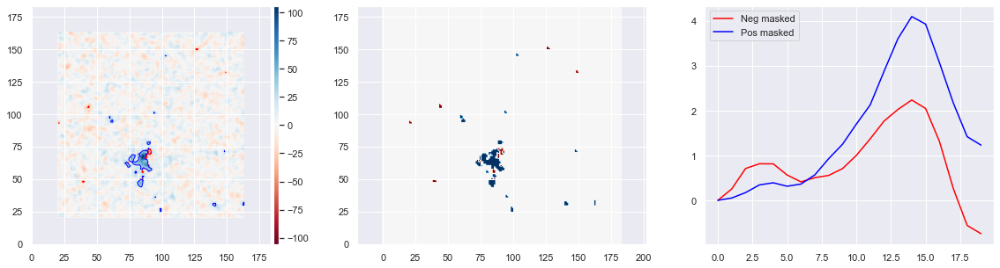

In [3]:
# Specify file and ROI
file_path = r"D:\Igor analyses\230502\2023-5-2_SMP_0_0_SWN_UV_25_0.h5"
roi = 0
# Get the data
Data = filehandling.load_strf_data(file_path)
# # Get contours
neg_contour, pos_contours = Data.contours[roi]
plotting.contouring(Data.strfs[roi])



Heres a logic: 
- Make a function that determines area per contour (might already have this)
- Figure out total possible area of STRF (ez pz, simple calculation X * Y)
- Make a thresholding dohicky where you specify the minimum amount of pixels for a contour (e.g., 5 pixels)
    - This threshold can be implemented within space.contours_area, as a check when looping through contour list 
- Based on calculation you know the approx area of 1 pixel, so kill any contours smaller than 1 pix * the above threshold

Area measurement will depend on STA input. I think it makes sense to anchor this in real units (e.g., degrees visang), because we know the theoretical minimal degree visang we should be able to resolve. So, set threshold to that limit...

In [81]:
space.contours_area_bipolar(Data.contours[0])

(array([], dtype=float64), array([33.83]))

In [140]:
dummy_contour_area = 12#33.83

sta_area = 25*25#dim1 X dim2 76*48
min_pix = 11
threshold = min_pix
print("STA area", sta_area)
print("Contour area", dummy_contour_area)
print("Threshold pix quantity", threshold)
if dummy_contour_area > threshold:
    print("woo")

STA area 625
Contour area 12
Threshold pix quantity 11
woo


0.01

In [48]:
one_pix_area * min_pix

1.0

In [24]:
33.83/(76*48) * 100

0.9273574561403508

In [54]:
dir(Data)

['__annotations__',
 '__class__',
 '__dataclass_fields__',
 '__dataclass_params__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__match_args__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_contours',
 '_contours_area',
 'collapse_times',
 'contours',
 'contours_area',
 'contours_count',
 'images',
 'ipl_depths',
 'metadata',
 'polarities',
 'rf_masks',
 'rf_masks_combined',
 'rois',
 'spectral_centroids',
 'spectrums',
 'strf_masks',
 'strfs',
 'timecourses',
 'timecourses_noncentred']

[2369.]
4800
[0.49354167]


C:\Users\SimenLab\AppData\Local\Temp\ipykernel_14212\2252006226.py:3: UserWarning: Keyword arg 'level' specified, ignoring threshold criteria.
  contour = space.contour_unipolar(test_array, level = 1)


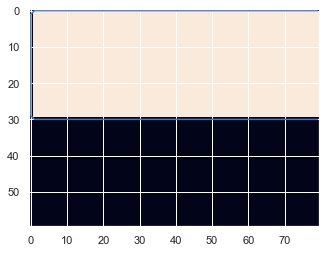

In [77]:
test_array = np.ones((60, 80))
test_array[1:30, 1:80] = 100
contour = space.contour_unipolar(test_array, level = 1)
contour_area = space.contours_area(contour)
# print(contour_area)
plt.imshow(test_array)
for i in contour:
    plt.plot(i[:, 1], i[:, 0])
print(contour_area)
# area_conversion(contour_area, 800)
print(80*60)
print(contour_area/(80*60))

12.823433755673868


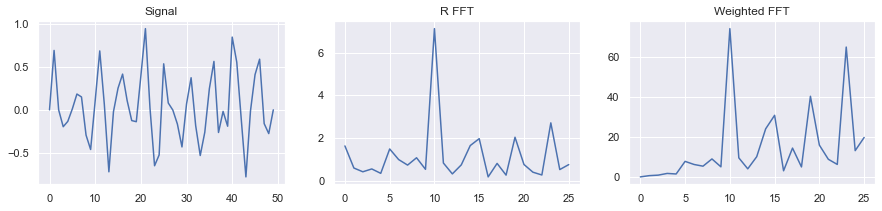

In [2]:
np.random.seed(1) 
fig, axs = plt.subplots(1, 3, figsize = (15, 3))
noisy_sinusoid = np.random.rand(50) * np.sin(np.linspace(0, 2*np.pi * 10 , 50))
real_fft = np.abs(np.fft.rfft(noisy_sinusoid).real)
weighted_fft = np.linspace(0, len(real_fft), len(real_fft)) * real_fft
# weighted_fft = real_fft * weights
axs[0].plot(noisy_sinusoid)
axs[0].set_title("Signal")
axs[1].plot(real_fft)
axs[1].set_title("R FFT")
axs[2].plot(weighted_fft)
axs[2].set_title("Weighted FFT")
# axs[3].plot(weighted_fft)
# axs[3].set_title("Weighted FFT")

print(np.sum(weighted_fft) / np.sum(real_fft))

c:\Users\SimenLab\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\temporal.py:166: UserWarning: Param 'sampling_rate' not given, frequency bins are arbitrary.
  warnings.warn("Param 'sampling_rate' not given, frequency bins are arbitrary." )


12.823433755673868


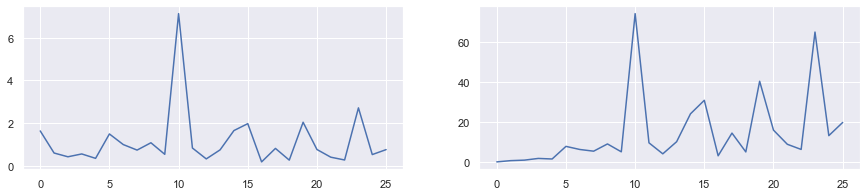

In [3]:
## Old implementation 
norm_spectrum, norm_freq, centroid = temporal.spectral_centroid(noisy_sinusoid)
fig, axs = plt.subplots(1, 2, figsize = (15, 3))
axs[0].plot(norm_spectrum)
axs[1].plot(norm_freq)
print(centroid)

5.079714270307736


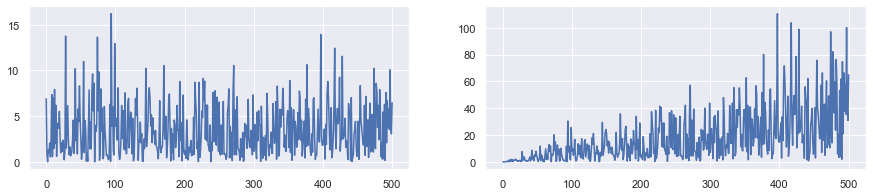

In [16]:
## New implementation 
norm_spectrum, norm_freq, centroid = temporal.spectral_centroid2(noisy_sinusoid, sampling_rate=20)
fig, axs = plt.subplots(1, 2, figsize = (15, 3))
axs[0].plot(norm_spectrum)
axs[1].plot(norm_freq)
print(centroid)

### Correcting visang 

In [3]:
# files = filehandling.find_files_in(".h5", r"D:\h5 subset")
# files = filehandling.find_files_in(".h5", r"C:\Users\SimenLab\local_data_copy\h5_subset")
# files = filehandling.find_files_in(".h5", r"D:\Igor analyses", recursive=True)
# files = filehandling.find_files_in(".h5", r"C:\Users\Simen\Downloads\All H5s")
# files = filehandling.find_files_in(".h5", r"C:\Simen_analysis", recursive=True)
# files = filehandling.find_files_in(".h5", r"C:\Users\Simen\Desktop\Curr h5 exports test", recursive=True)
files = filehandling.find_files_in(".h5", r"D:\Igor analyses", recursive = True)
files

[WindowsPath("D:/Igor analyses/220803/2022-8-3_'SMP_SWN0_BW_400_25%_v_0'.h5"),
 WindowsPath("D:/Igor analyses/220803/2022-8-3_'SMP_SWN0_BW_800_25%_v_1'.h5"),
 WindowsPath("D:/Igor analyses/220803/2022-8-3_'SMP_SWN0_R_400_25%_v_0'.h5"),
 WindowsPath("D:/Igor analyses/220803/2022-8-3_'SMP_SWN_BW_200_25%_h_0'.h5"),
 WindowsPath('D:/Igor analyses/220804/2022-8-4_SMP_SWN_400_0_6_0_3reps.h5'),
 WindowsPath('D:/Igor analyses/220805/2022-8-5_SMP_1_5_SWN_BW200_0.h5'),
 WindowsPath('D:/Igor analyses/220805/2022-8-5_SMP_1_5_SWN_BW400_0.h5'),
 WindowsPath('D:/Igor analyses/220816/SMP_0_6_SWN_200_UV_0_SD.h5'),
 WindowsPath('D:/Igor analyses/220817/SMP_0_3_SWN_UV_200_0.h5'),
 WindowsPath('D:/Igor analyses/220824/SMP_0_4_SWN_UV200_25p_0.h5'),
 WindowsPath('D:/Igor analyses/220825/SMP_0_0_SWN200_25p_R_0.h5'),
 WindowsPath('D:/Igor analyses/221020/2022-10-20_SMP_0_3_ColorFlashes_0.h5'),
 WindowsPath('D:/Igor analyses/221020/2022-10-20_SMP_0_3_SWN_200_G_0.h5'),
 WindowsPath('D:/Igor analyses/221020/2022

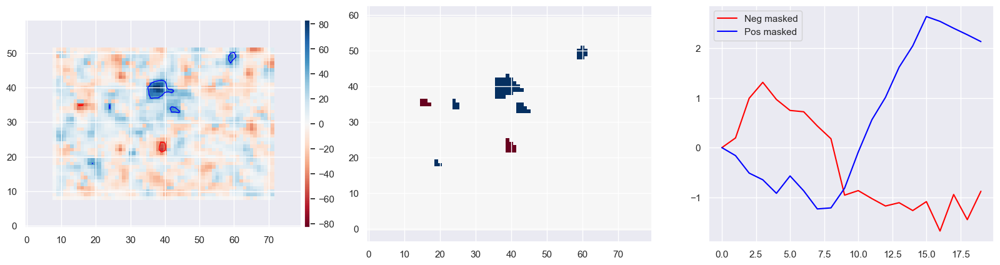

In [63]:
Data = filehandling.load_strf_data(files[-6]) # -5
# # Get
roi = 9 # 0
plotting.contouring(Data.strfs[roi], level = 45)



In [64]:
plotting.play_movie(Data.strfs[roi])


In [14]:
# import sys
# import pickle
# outfile = r"C:\Users\Simen\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\test.pickle"
# with open(outfile, 'wb') as pickle_file:
#     pickle.dump(Data, pickle_file)


In [15]:
# Initialise phyisical parameters
fish_screen_dist_mm = 160 # measured from fish to center
screen_width_mm = 300 # total width 
screen_half_width_mm = screen_width_mm/2 # right-angle
# According to pythagorean theorem 
hypoth_mm = np.sqrt(fish_screen_dist_mm**2 + screen_half_width_mm**2)
# Compute angle between fish and one side of screen (such that we get a right angel) 
sin = screen_half_width_mm / hypoth_mm # oppose/hypth
cos = fish_screen_dist_mm / hypoth_mm # adjecent/hypth
tan =  screen_half_width_mm /fish_screen_dist_mm # opposite/adjecent 
# Sanity check 
arcsin = np.round(np.arcsin(sin), 8)
arccos = np.round(np.arccos(cos), 8)
arctan = np.round(np.arctan(tan), 8)
assert np.isclose(arcsin, arccos, arctan)
# Get screen width in degrees vis ang 
half_screen_vis_ang = np.rad2deg(arcsin)
screen_vis_ang = half_screen_vis_ang * 2 # because two right angle triangles added, e.g. 2x the angle 
print("Screen is", np.round(screen_vis_ang, 3), "degrees wide")

Screen is 86.305 degrees wide


In [16]:
# Initilaise software parameters
screen_width_pix_au = 1820 # QDSpy display area in QDSpy units (confusingly named 'um' but is arbitrary unit (so 'au'))
screen_height_pix_au = 1140
block_size_au = 200 # squared
# Calculte the visang per pix 
single_pix_visang = screen_vis_ang / screen_width_pix_au
# Calculate block vis ang 
block_visang = single_pix_visang * block_size_au
# Work out how many blocks fit on on screen 
blocks_on_screen_horz = screen_width_pix_au/block_size_au
blocks_on_screen_vert = screen_height_pix_au/block_size_au

print("Screen is", (blocks_on_screen_vert, blocks_on_screen_horz), "pix")
print("Pix size vis ang", block_visang)

Screen is (5.7, 9.1) pix
Pix size vis ang 9.484041687664996


In [17]:
54.059 / 9.5

5.690421052631579

9.1 boxes across 85.306 degrees. That means each box is very nearly 9.5 degree vis ang (more like 9.387 smth)
Each box is 200pix * 9.1 boxes = 1820 pix across screen, which agrees with QDSpy.ini (and 200*5.7 = 1140 in height)
The STA is 20 boxes wide and 15 boxes tall, * 4 = 80, 60

The bigger the box size on display, the more the values should be scaled UP because the input STA is the same size. So, responses to for example 6 x 2 boxes (in extreme cases like 800um), will lead to just a small amount of pixels in the 15 x 20 condition. Thus, the size is UNDER-exaggurated. If the displayed boxes are smaller (100, 12x18), it will be more comparable to the 15x20 array and the scaling should be far closer to 0. If the box size is so small that the displayed checkerboard is smaller than the screen size, then we should get a value scale by lower than 1. 

In [65]:
screen_height_width_visang = (54.059, 86.305)

def calculate_boxes_on_screen(box_width_pix, screen_width_pix_au = 1820, screen_height_pix_au = 1140):
    # Work out how many blocks fit on on screen 
    blocks_on_screen_horz = screen_width_pix_au/box_width_pix
    blocks_on_screen_vert = screen_height_pix_au/box_width_pix
    return np.array([blocks_on_screen_vert, blocks_on_screen_horz])

def au_to_visang(box_width_pix, screen_width_pix = 1820, screen_width_visang = 86.306):
    """
    The coordinates in STRFs are arbitrarily determined by the input array during STA. 
    This function returns a scaler which can be used to make these arbitrary values tied to 
    real measurements of visual angle for the stimulator screen. 
    """
    # Calculte the visang per pix 
    single_pix_visang = screen_width_visang / screen_width_pix
    # Calculate block vis ang 
    block_visang = single_pix_visang * box_width_pix
    return block_visang

def area_conversion(area_float, boxsize_um, sta_boxes_tuple = (15, 20)):
    # Get the amount of boxes that fit on the real screen
    screen_boxes_tuple = calculate_boxes_on_screen(boxsize_um)
    ## Calculate that area 
    screen_area_sq = np.multiply(screen_boxes_tuple[0], screen_boxes_tuple[1])
    # Calculate the area of the STA
    sta_area_sq = np.multiply(sta_boxes_tuple[0], sta_boxes_tuple[1])
    ## Determine the ratio between the boxes on screen and the STA boxes (without upscale factor)
    screen_areas_ratio = sta_area_sq / screen_area_sq 
    ## Multiply that ratio by the area_float to scale the area proportionally
    return np.sqrt(screen_areas_ratio * area_float)


In [76]:
calculate_boxes_on_screen(100) 

array([11.4, 18.2])

[5.76541412]


c:\Users\Simen\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:412: UserWarning: Lower contour did not pass threshold criteria
  contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)


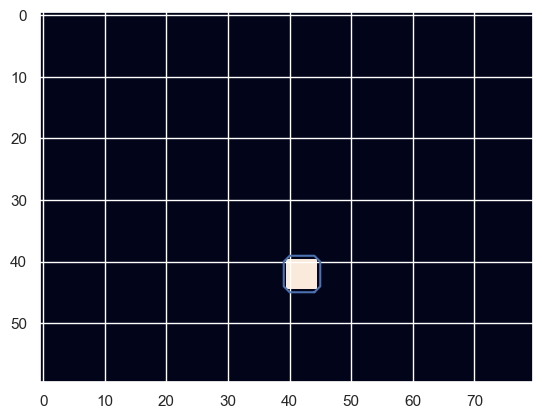

In [19]:
test_array = np.ones((60, 80))
test_array[40:45, 40:45] = 5
contour = space.contour(test_array, 2)[1]
contour_area = space.contours_area(contour)
# print(contour_area)
plt.imshow(test_array)
for i in contour:
    plt.plot(i[:, 1], i[:, 0])
print(np.sqrt(contour_area))
# area_conversion(contour_area, 800)

In [20]:
86*54

4644

In [11]:
roi_df

,ipl_depths,roi,filename,colour,paired,combo,size,frequency,noise,polarities,...,+peaktime,-contour_count,+contour_count,total_contour_count,-contour_areas,+contour_areas,-contour_area_total,+contour_area_total,contour_area_total,notes
0,96.0,0,2022-10-20_SMP_0_3_SWN_200_G_0.h5,G,n,NaN,200,NaN,SWN,2.0,...,16,11,10,21,"[0.7976251621932411, 2.344036154692477, 9.9419...","[1.717463797886383, 0.6802170238514358, 0.2404...",52.184905,11.549218,63.734124,
1,96.0,1,2022-10-20_SMP_0_3_SWN_200_G_0.h5,G,n,NaN,200,NaN,SWN,2.0,...,14,7,2,9,"[13.819458875405454, 1.5770182933349295, 4.355...","[1.9685203316513975, 4.308786938505356]",30.616995,6.277307,36.894302,
2,89.0,2,2022-10-20_SMP_0_3_SWN_200_G_0.h5,G,n,NaN,200,NaN,SWN,2.0,...,16,17,14,31,"[3.9075493067562257, 6.577385586746303, 1.6661...","[8.141319753806437, 1.5770182933349295, 3.2355...",52.504750,39.883058,92.387808,
3,93.0,3,2022-10-20_SMP_0_3_SWN_200_G_0.h5,G,n,NaN,200,NaN,SWN,2.0,...,15,16,11,27,"[3.0420230095688128, 1.2950946290996384, 6.836...","[0.2404930351219409, 1.2950946290996384, 0.240...",53.864603,26.874097,80.738700,
4,85.0,4,2022-10-20_SMP_0_3_SWN_200_G_0.h5,G,n,NaN,200,NaN,SWN,2.0,...,16,9,11,20,"[2.945426113709944, 2.8758784208880117, 0.7605...","[4.024218182927669, 3.2175775188248683, 5.6040...",20.892373,64.282883,85.175256,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1068,58.0,17,SMP_0_9_SWN200_25p_UV_0.h5,UV,n,NaN,200,NaN,SWN,2.0,...,14,7,9,16,"[0.3401085119257179, 0.7605057523922032, 0.537...","[3.5426836279082825, 1.0203255357771537, 0.480...",8.466591,36.061993,44.528584,
1069,74.0,18,SMP_0_9_SWN200_25p_UV_0.h5,UV,n,NaN,200,NaN,SWN,2.0,...,15,19,20,39,"[3.771985867652757, 0.3401085119257179, 3.5426...","[2.623469285720229, 6.982585957311481, 7.65433...",41.151960,55.532269,96.684229,
1070,34.0,19,SMP_0_9_SWN200_25p_UV_0.h5,UV,n,NaN,200,NaN,SWN,2.0,...,14,6,20,26,"[0.8330923113952962, 0.2404930351219409, 0.537...","[0.2404930351219409, 2.1375488521741173, 6.280...",10.237472,49.999776,60.237248,
1071,63.0,20,SMP_0_9_SWN200_25p_UV_0.h5,UV,n,NaN,200,NaN,SWN,2.0,...,15,13,19,32,"[2.7839081508285894, 0.8330923113952962, 2.634...","[0.4809860702438818, 0.5890852227419888, 0.867...",30.158527,53.044628,83.203155,


# Contouring 

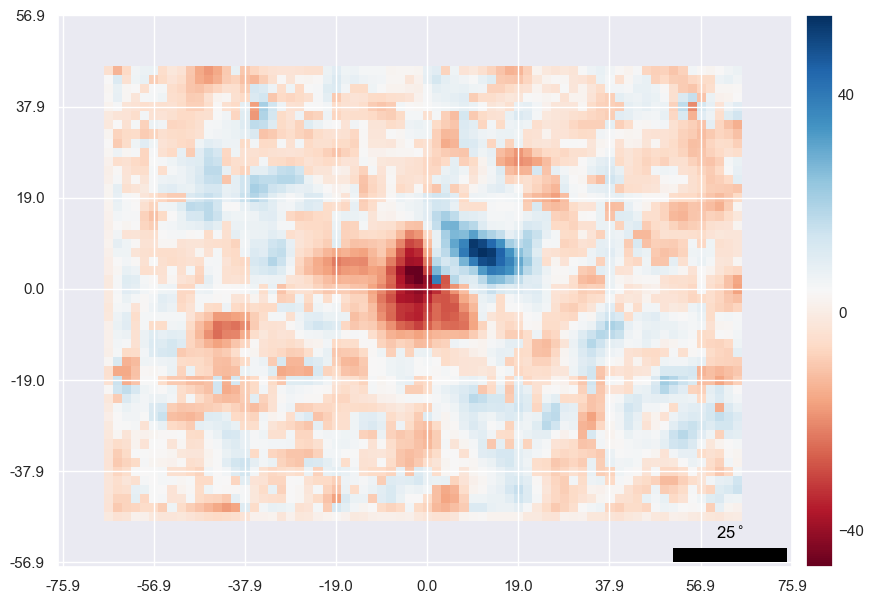

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10), subplot_kw = {"adjustable":"box", "aspect": 0.6237})
isns.imshow(Data.collapse_times()[6], ax = ax, 
    dx = 2, units = 'deg', dimension = "angle", cmap = "RdBu", showticks = True)
isns.set_scalebar(color="black")

# x_ticks = np.linspace(0, 80, 21)
# y_ticks = np.linspace(0, 60, 15)
# ax.set_xticks(x_ticks)
# ax.set_yticks(y_ticks);
# ax.set_xticklabels(np.round(np.linspace(-(20 * 9.48)/2, (20 * 9.48)/2, 21), 1));
# ax.set_yticklabels(np.round(np.linspace(-(12 * 9.48)/2, (12 * 9.48)/2, 15), 1));

num_x_boxes = 8 
num_y_boxes = 6
x_ticks = np.linspace(0, 80, num_x_boxes + 1)
y_ticks = np.linspace(0, 60, num_y_boxes + 1)
scale = au_to_visang(200) * 2
ax.set_xticks(x_ticks)
ax.set_yticks(y_ticks);
ax.set_xticklabels(np.round(np.linspace(-(num_x_boxes * scale)/2, (num_x_boxes * scale)/2, num_x_boxes + 1), 1));
ax.set_yticklabels(np.round(np.linspace(-(num_y_boxes * scale)/2, (num_y_boxes * scale)/2, num_y_boxes + 1), 1));

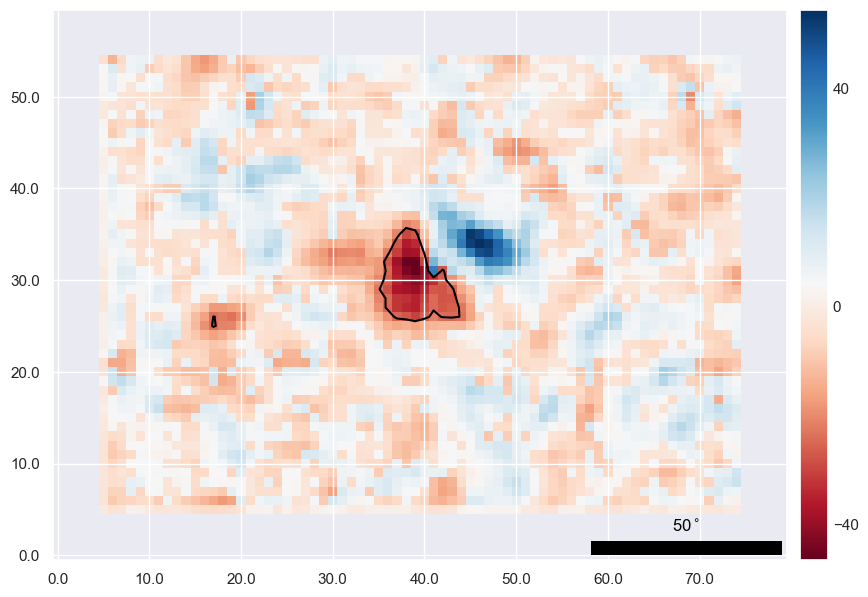

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10), subplot_kw = {"adjustable":"box", "aspect": 0.6237})
isns.imshow(Data.collapse_times()[6], ax = ax, 
    dx = 2.4, units = 'deg', dimension = "angle", cmap = "RdBu", showticks = True)
isns.set_scalebar(color="black")

num_x_boxes = 8 
num_y_boxes = 6 
scale = 1
x_ticks = np.linspace(0, 80, num_x_boxes + 1)
y_ticks = np.linspace(0, 60, num_y_boxes + 1)
ax.set_xticks(x_ticks)
ax.set_yticks(y_ticks);
ax.set_xticklabels(np.round(x_ticks, 1));
ax.set_yticklabels(y_ticks);
Data.contours[6]
for contour in Data.contours[6][0]:
    ax.plot(contour[:, 1], contour[:, 0], c = 'black')

# File loading 
This actually works really nice. Keep!

In [2]:
# dir_path = 'D:/Igor analyses/220825/H5 exports'
# dir_path = 'D:/test h5s'
# dir_path = r"C:\Users\skrem\Desktop"
dir_path = os.getcwd()
target = filehandling.find_files_in(".h5", dir_path, recursive=True)
target

[WindowsPath('c:/Users/skrem/OneDrive/Universitet/PhD/GitHub repos/RF_analysis/demo_data_strfs.h5'),
 WindowsPath('c:/Users/skrem/OneDrive/Universitet/PhD/GitHub repos/RF_analysis/old_demo_data_strfs.h5')]

In [7]:
demo_file_path = pathlib.Path(os.getcwd()).joinpath("demo_data_strfs.h5")
vanilla_data = filehandling.load_data(demo_file_path)
strf_data = filehandling.load_strf_data(demo_file_path)

c:\Users\skrem\OneDrive\Universitet\PhD\GitHub repos\RF_analysis\space.py:409: UserWarning: Upper contour did not pass threshold criteria
  contour_lower, contour_upper = _draw_contour_bipolar(arr_2d, abs_criteria)


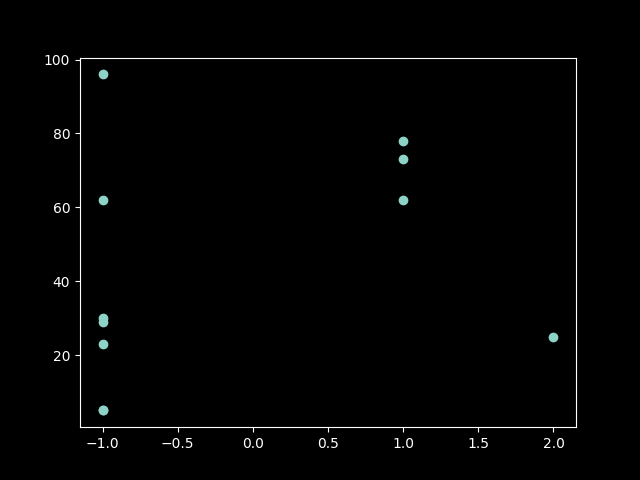

In [8]:
plt.scatter(strf_data.polarities(),  strf_data.ipl_depths)
plt.show()

1.0


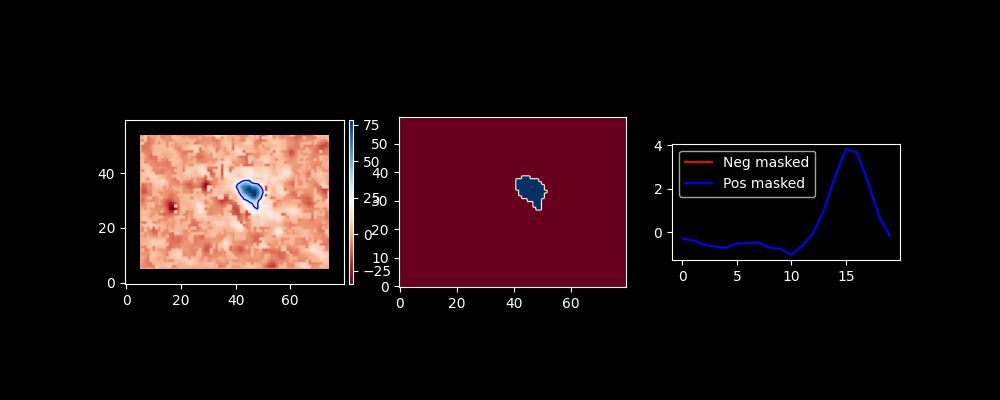

In [19]:
num = 6
plotting.contouring(strf_data.strfs[num])
print(strf_data.polarities()[num])
plt.show()